Problem Statement:
Data Set Information:

This data is for the purpose of bias correction of next-day maximum and minimum air temperatures forecast of the LDAPS model operated by the Korea Meteorological Administration over Seoul, South Korea. This data consists of summer data from 2013 to 2017. The input data is largely composed of the LDAPS model's next-day forecast data, in-situ maximum and minimum temperatures of present-day, and geographic auxiliary variables. There are two outputs (i.e. next-day maximum and minimum air temperatures) in this data. Hindcast validation was conducted for the period from 2015 to 2017.

So, basically our goal in this case is to predict 2 targets which are :
1) Next_Tmax: Next day maximum temperature
2) Next_Tmin: Next day  minimum temperature

In [1]:
import warnings 
warnings.filterwarnings('ignore')

In [2]:
    # importing required libraries.
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [3]:
!pip install openpyxl

     |████████████████████████████████| 242 kB 4.8 MB/s eta 0:00:01


In [3]:
# reading train and test data
train_data = pd.read_csv('temperature.csv')

In [4]:
#checking shape of our dataset
train_data.shape

(7752, 25)

The dataset has 7752 rows and 25 features including the 2 targets. We will predict these 2 target variable for the test dataset later when we get the best model and we do the best cross validation through GridSearchCV and hypertunned it!

In [5]:
#checking the first 5 rows of our dataset:

train_data.head()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,30-06-2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,30-06-2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5


1. We have station id number for each instance. Maybe we can visualize the data by different stations. Will be interesting!
2. We also have feature "Date", from which we can get Day, Month and Year. Hence, we can analyze our instances by different period of time.
3. Present Tmax and Present Tmin informs us the current temperature of each instance we have.
4. Then, we have different kind of LDAPS which we can analyze more in detail.
5. Latitude ande Longitude  will help us to understand the location of the station and understand also the temperature the station has.
6. And finally, not least, we have DEM, Slope and Solar radiation which will complete our analize and helps us in giving the best learning of patterns to our Machine Learning algorithms.

In [6]:
#statistical description of the data
train_data.describe()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
count,7750.000000,7682.000000,7682.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,...,7677.000000,7677.000000,7677.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7725.000000,7725.000000
mean,13.000000,29.768211,23.225059,56.759372,88.374804,29.613447,23.512589,7.097875,62.505019,0.368774,...,0.485003,0.278200,0.269407,37.544722,126.991397,61.867972,1.257048,5341.502803,30.274887,22.932220
std,7.211568,2.969999,2.413961,14.668111,7.192004,2.947191,2.345347,2.183836,33.730589,0.262458,...,1.762807,1.161809,1.206214,0.050352,0.079435,54.279780,1.370444,429.158867,3.128010,2.487613
min,1.000000,20.000000,11.300000,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,0.000000,...,0.000000,0.000000,0.000000,37.456200,126.826000,12.370000,0.098475,4329.520508,17.400000,11.300000
25%,7.000000,27.800000,21.700000,45.963543,84.222862,27.673499,22.089739,5.678705,37.266753,0.146654,...,0.000000,0.000000,0.000000,37.510200,126.937000,28.700000,0.271300,4999.018555,28.200000,21.300000
50%,13.000000,29.900000,23.400000,55.039024,89.793480,29.703426,23.760199,6.547470,56.865482,0.315697,...,0.000000,0.000000,0.000000,37.550700,126.995000,45.716000,0.618000,5436.345215,30.500000,23.100000
75%,19.000000,32.000000,24.900000,67.190056,93.743629,31.710450,25.152909,8.032276,84.223616,0.575489,...,0.018364,0.007896,0.000041,37.577600,127.042000,59.832400,1.767800,5728.316406,32.600000,24.600000
max,25.000000,37.600000,29.900000,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,0.967277,...,21.621661,15.841235,16.655469,37.645000,127.135000,212.335000,5.178230,5992.895996,38.900000,29.800000


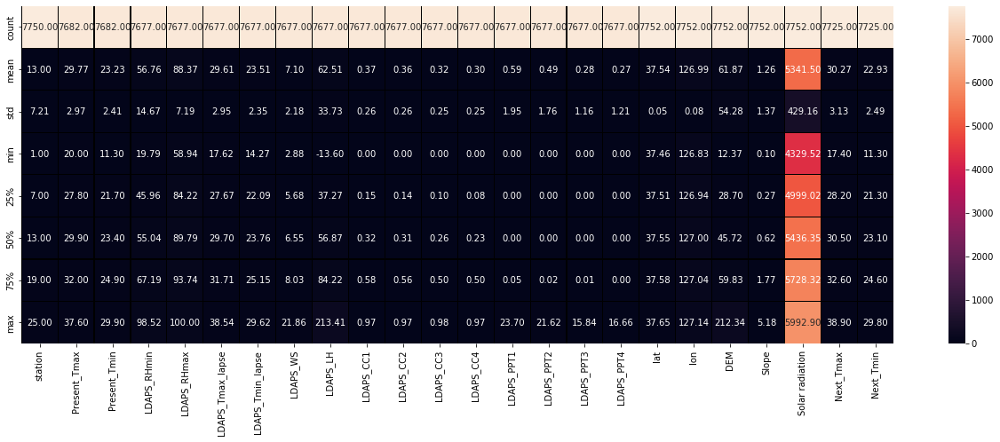

In [7]:
import matplotlib.pyplot as plt
plt.figure(figsize=(22,7))
sns.heatmap(train_data.describe(),annot=True,linewidth=0.1,linecolor="black",fmt="0.2f")

First of all, we notice we have missing values if we check the first row of our dataframe statistical description as few of the number of cases are lower than the max of the same.

Secondly, we also see we have positive and negative skewness in several features of our dataframe. We have left skewness in features Present Tmin, Present Tmax, LDAPS RHmax, LDAPS Tmin lapse, LDAPS Tmax lapse, lat(a bit, no much difference) and lon (a bit) and Next Tmin and Next Tmax as these do have mean lesser than median. And we have right skewness in the others except Station. The features that has right skewness are LDAPS_RHMmin, LDAPS_WS, LDAPS_LH, all the LDAPS_CC and LDAPS_PPT, DEM, SLOPE and Solar Radiation as these have median lesser than mean.

And there is no skewness in Station. Good!

And finally, not least, we have some outliers as we chec the maximum and 75% quantile of the data. So, we need to analize if these outliers will have important impact on our model training.


In [8]:
#let' now check the data types we have:
train_data.dtypes

station             float64
Date                 object
Present_Tmax        float64
Present_Tmin        float64
LDAPS_RHmin         float64
LDAPS_RHmax         float64
LDAPS_Tmax_lapse    float64
LDAPS_Tmin_lapse    float64
LDAPS_WS            float64
LDAPS_LH            float64
LDAPS_CC1           float64
LDAPS_CC2           float64
LDAPS_CC3           float64
LDAPS_CC4           float64
LDAPS_PPT1          float64
LDAPS_PPT2          float64
LDAPS_PPT3          float64
LDAPS_PPT4          float64
lat                 float64
lon                 float64
DEM                 float64
Slope               float64
Solar radiation     float64
Next_Tmax           float64
Next_Tmin           float64
dtype: object

We see we only have float data types which is okay for machine learning except Date which is an object that we need to convert to data time type for our analisis and then encode it to number type in order to insert it to our machine learning modeling.

We will now check the count of NaN (null) values in our dataset:

In [9]:
train_data.isnull().sum()

station              2
Date                 2
Present_Tmax        70
Present_Tmin        70
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

In [10]:
#doing some others libraries imports and set option to visualize maximum comlumns we have:
#linear algebra
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', 25)

#Plotting
import seaborn as sns
import matplotlib.pyplot as plt


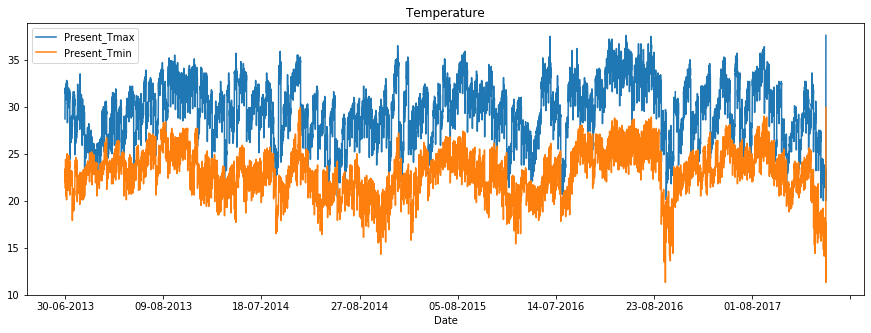

In [11]:
# Timeline plot of the our temperatures

train_data.plot(x='Date', y=['Present_Tmax', 'Present_Tmin'], figsize=(15,5), 
        title='Temperature')

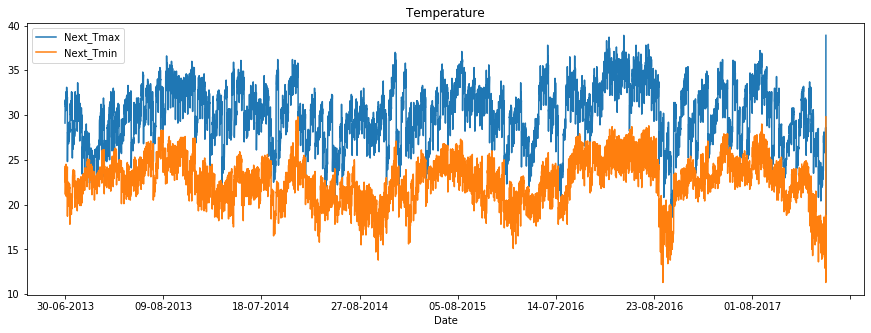

In [12]:

train_data.plot(x='Date', y=[ 'Next_Tmax','Next_Tmin'], figsize=(15,5), 
        title='Temperature')

Regarding both previous timeline graphs, we see no big difference or radical changes. The only change we can highlight here is the one on around 23 of august and another around month 9 of year 2018.



In [ ]:
#Will plot pairplot of all features:
sns.pairplot(train_data)

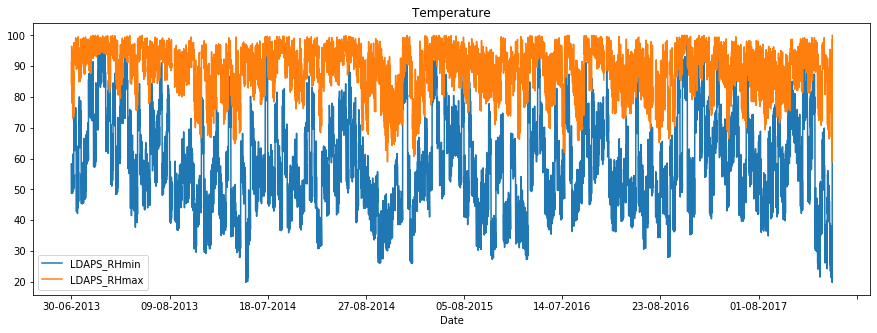

In [13]:
train_data.plot(x='Date', y=[ 'LDAPS_RHmin','LDAPS_RHmax'], figsize=(15,5), 
        title='Temperature')

We see the 'LDAPS_RHmin' and'LDAPS_RHmax' going mostly between 30 and 100. 

What we can mention here is that RHmin, as expected, are lower in temperature and RHmax has higher temperatures.

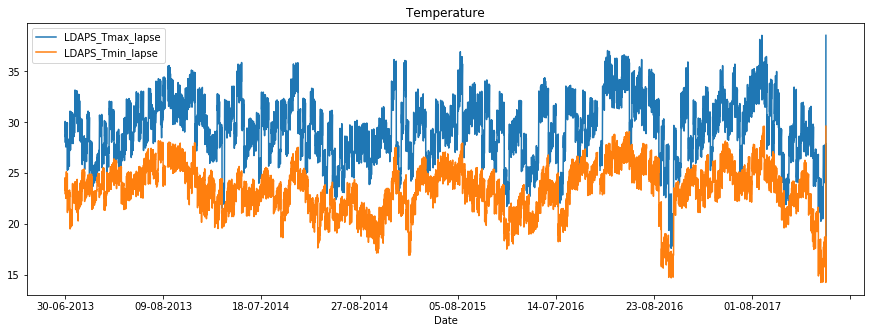

In [14]:
train_data.plot(x='Date', y=[ 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse'], figsize=(15,5), 
        title='Temperature')

We see the 'LDAPS_Tmax_lapse' and'LDAPS_Tmin_lapse' going mostly between 20 and 100. 

What we can mention here is that LDAPS_Tmin_lapse, as expected, are lower in temperature and LDAPS_Tmax_lapse has higher temperatures compared to the other.

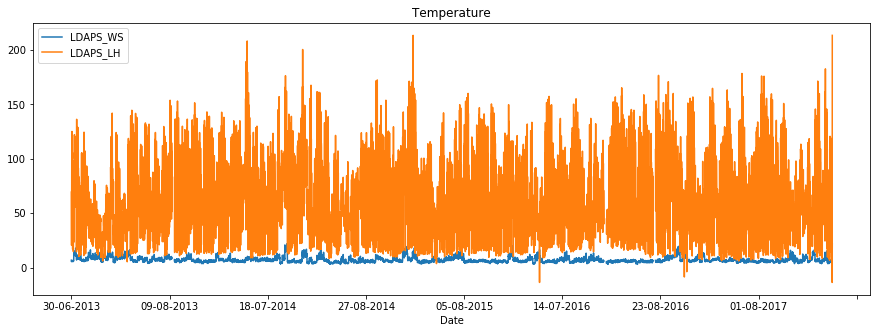

In [15]:
train_data.plot(x='Date', y=[ 'LDAPS_WS','LDAPS_LH'], figsize=(15,5), 
        title='Temperature')

    If we compare the LDAPS_LH with the LDAPS_WS, we see the LDAPS_LH has wide range of values and it goes from almost 0 to almost at max average of 150.
    
    The downside of the graph shows us that LDAPS_WS is much lower than the LDAPS_LH, almost right between the lowest values of the LDAPS_LH values. 

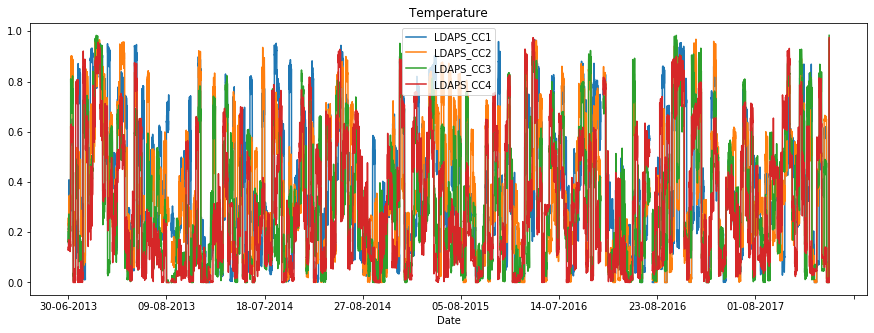

In [16]:
train_data.plot(x='Date', y=[ 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4'], figsize=(15,5), 
        title='Temperature')

Values of 'LDAPS_CC*' has amounts between 0 and almost 1 which is okay!

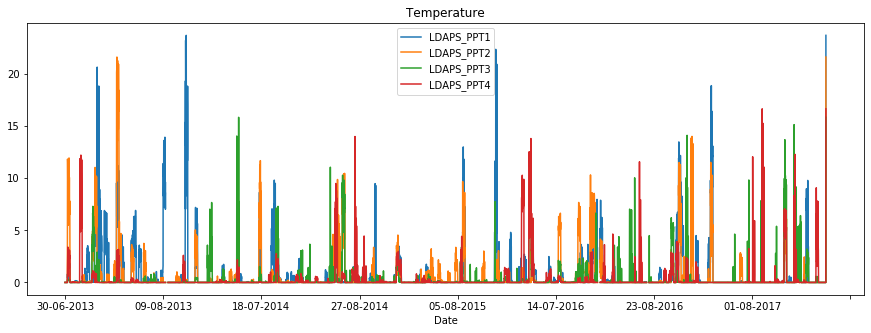

In [17]:
train_data.plot(x='Date', y=[ 'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4'], figsize=(15,5), 
        title='Temperature')

Values of 'LDAPS_PPT*' has amounts mostly between 0 and almost 15. we have values tht also goes till 20 or more. 

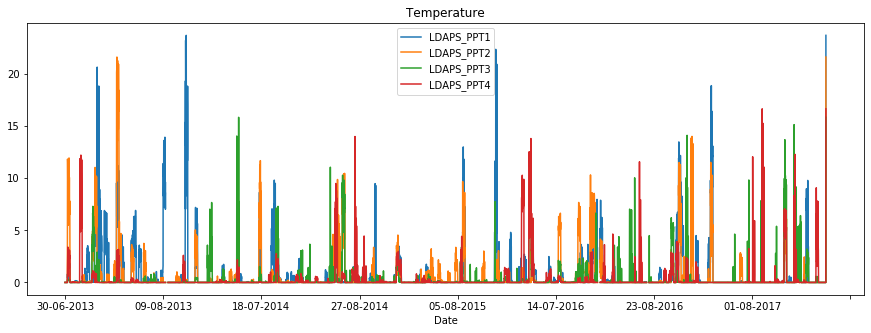

In [18]:
train_data.plot(x='Date', y=[ 'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4'], figsize=(15,5), 
        title='Temperature')

In [6]:
#let's convert now the Date feature into Date, Month and Year feature so that we analize the data by different periods of timeline:
train_data.loc[:,'Date'] = pd.to_datetime(train_data['Date'])

In [7]:
#Splititng the Date into Year, Month and Day

train_data['Year']  = train_data['Date'].dt.year
train_data['Month'] = train_data['Date'].dt.month
train_data['Day']   = train_data['Date'].dt.day


In [17]:
#checking columns of the dataframe:
train_data.columns

Index(['station', 'Date', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin',
       'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS',
       'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4',
       'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon',
       'DEM', 'Slope', 'Solar radiation', 'Next_Tmax', 'Next_Tmin', 'Year',
       'Month', 'Day'],
      dtype='object')

Text(0.5, 1, 'Present Tmax by different Month')

<Figure size 576x360 with 0 Axes>

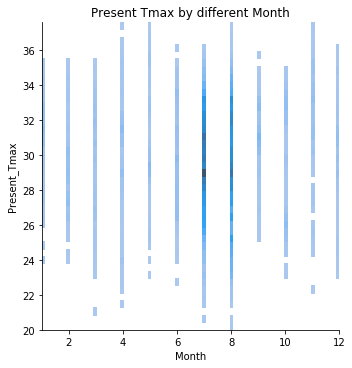

In [8]:
#now let's check the Present maximum temperature by different months:
plt.figure(figsize=(8,5))
sns.displot(x='Month',y='Present_Tmax',data=train_data, palette='rainbow')
plt.title("Present Tmax by different Month")

We can see we have wide range of present maximum temperature by different months. There are few months that has less width than others and those are month 2, 3, 9 and 10.

In [23]:
#remembering the dtypes:
train_data.dtypes

station                    float64
Date                datetime64[ns]
Present_Tmax               float64
Present_Tmin               float64
LDAPS_RHmin                float64
LDAPS_RHmax                float64
LDAPS_Tmax_lapse           float64
LDAPS_Tmin_lapse           float64
LDAPS_WS                   float64
LDAPS_LH                   float64
LDAPS_CC1                  float64
LDAPS_CC2                  float64
LDAPS_CC3                  float64
LDAPS_CC4                  float64
LDAPS_PPT1                 float64
LDAPS_PPT2                 float64
LDAPS_PPT3                 float64
LDAPS_PPT4                 float64
lat                        float64
lon                        float64
DEM                        float64
Slope                      float64
Solar radiation            float64
Next_Tmax                  float64
Next_Tmin                  float64
Year                       float64
Month                      float64
Day                        float64
dtype: object

/srv/conda/envs/notebook/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
/srv/conda/envs/notebook/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
/srv/conda/envs/notebook/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warnin

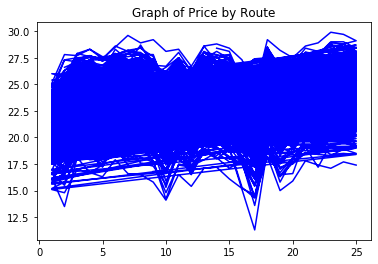

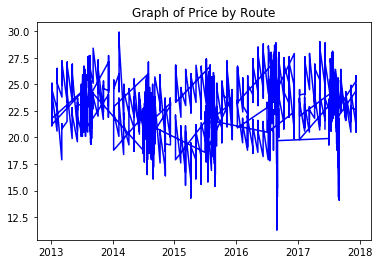

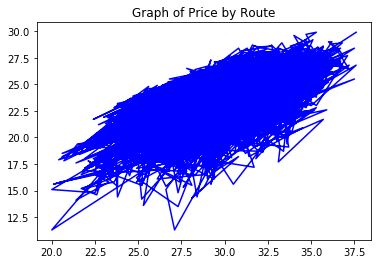

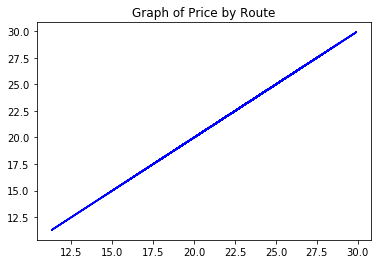

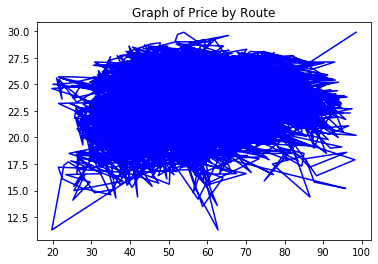

...

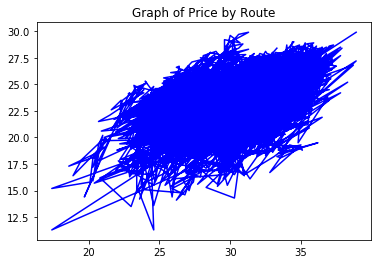

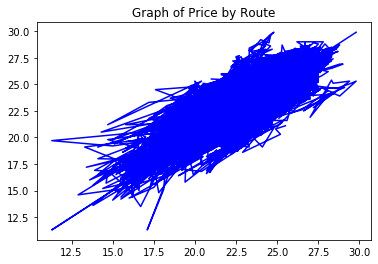

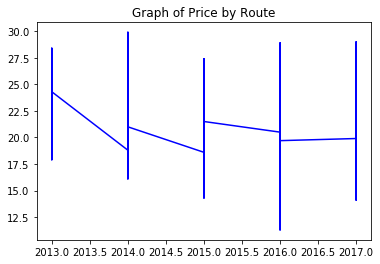

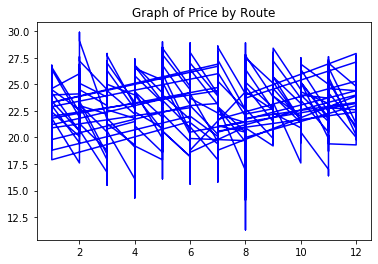

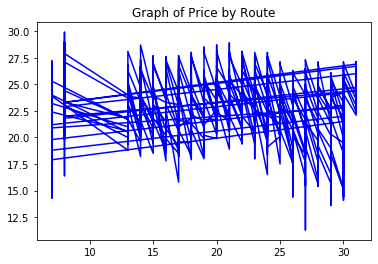

In [24]:
#let's creat the plot of all columns and relate them to feature Present Tmin:
for col in train_data.columns:  
    fig = plt.figure()
    ax = plt.axes()
    x = train_data[col]
    y=train_data['Present_Tmin']
    plt.title('Graph of Price by Route')
    ax.plot(x, y, 'b', label='Temperature')

We can see almost all the plots have the same range of both parameters. But, let's comment the highlightable graph where we do not see similar range of both parameters and these are:

From the top, the third, fourth, seventh, eigth, and fro the bottom we have the fourth and fifth from the bottom. All these have positive or negative linear high imoact as one the features changes. If it changes, the other one changes more or less than the first independent feature.

/srv/conda/envs/notebook/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
/srv/conda/envs/notebook/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
/srv/conda/envs/notebook/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warnin

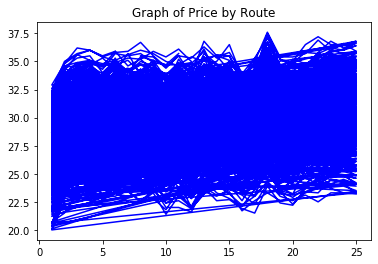

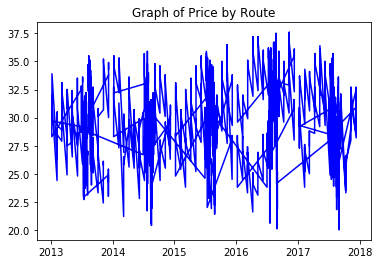

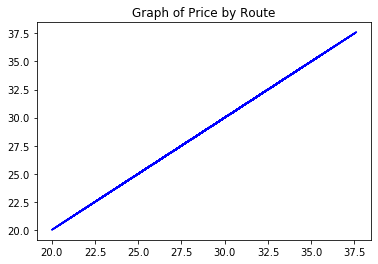

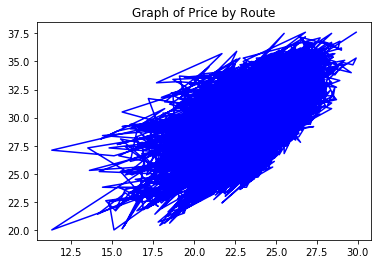

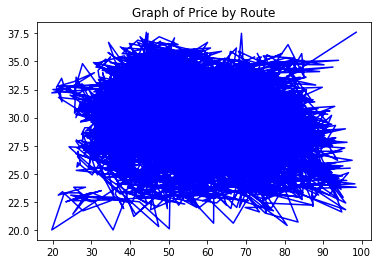

...

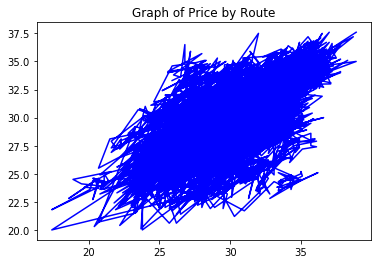

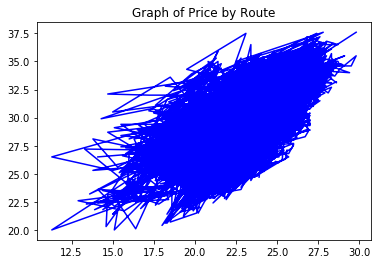

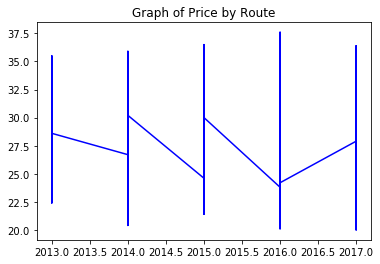

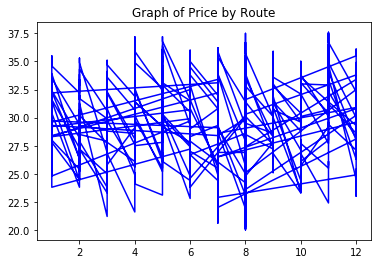

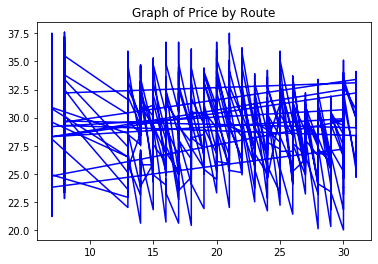

In [25]:
#let's creat the plot of all columns and relate them to feature Present Tmax:
for col in train_data.columns:  
    fig = plt.figure()
    ax = plt.axes()
    x = train_data[col]
    y=train_data['Present_Tmax']
    plt.title('Graph of Price by Route')
    ax.plot(x, y, 'b', label='Temperature')

Regarding the present Tmax, the same comments as above!

/srv/conda/envs/notebook/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
/srv/conda/envs/notebook/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
/srv/conda/envs/notebook/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warnin

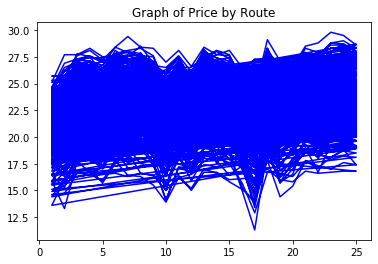

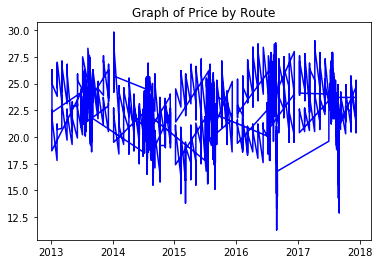

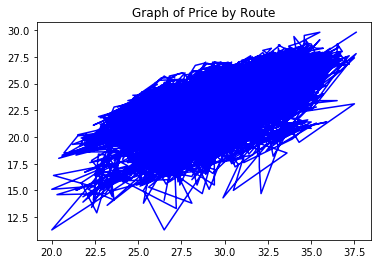

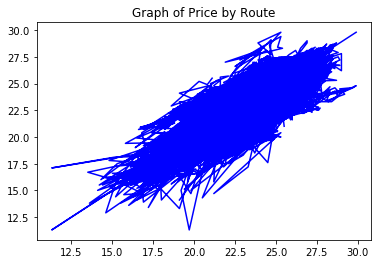

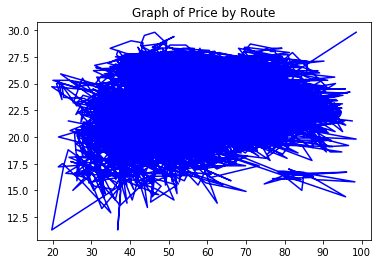

...

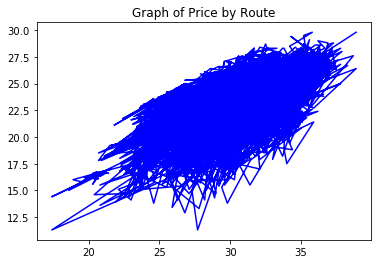

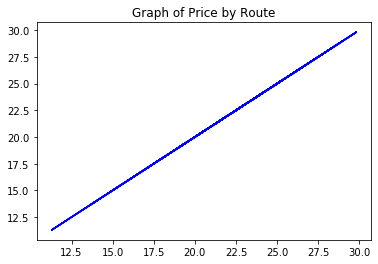

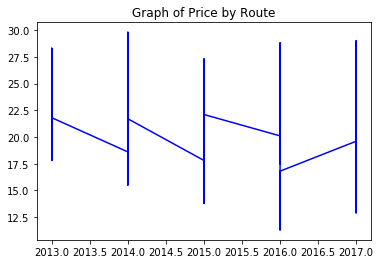

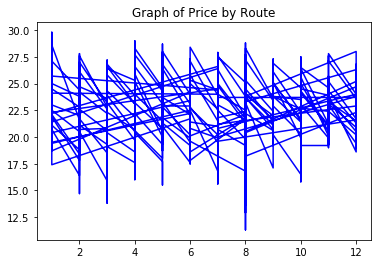

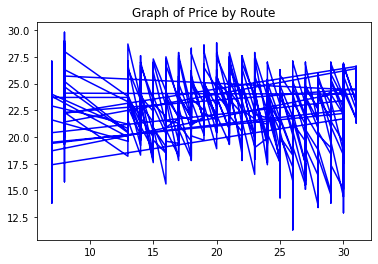

In [26]:
for col in train_data.columns:  
    fig = plt.figure()
    ax = plt.axes()
    x = train_data[col]
    y=train_data['Next_Tmin']
    plt.title('Graph of Price by Route')
    ax.plot(x, y, 'b', label='Temperature')

/srv/conda/envs/notebook/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
/srv/conda/envs/notebook/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
/srv/conda/envs/notebook/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warnin

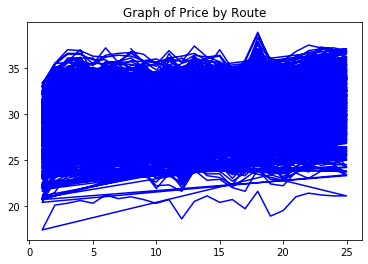

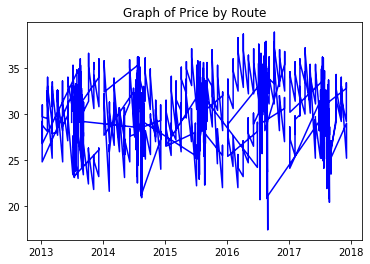

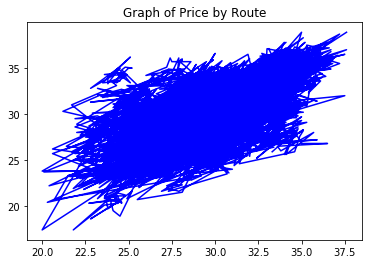

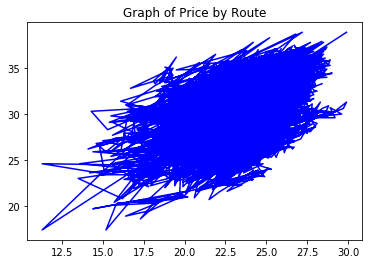

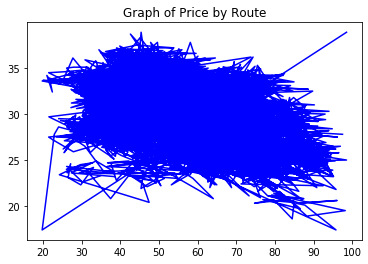

...

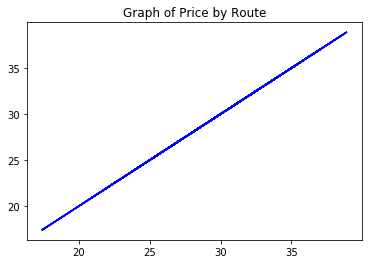

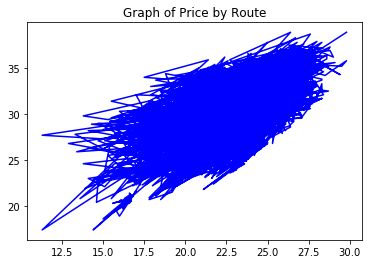

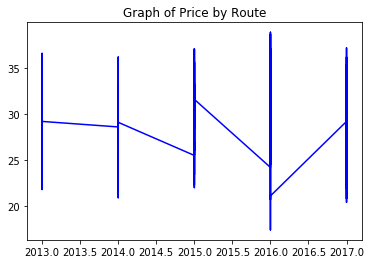

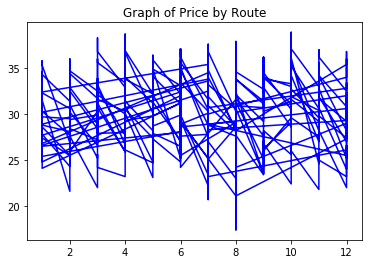

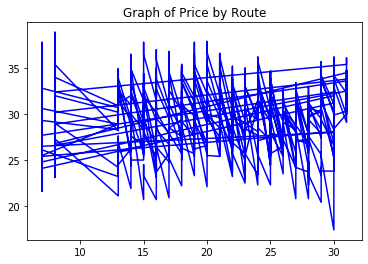

In [27]:
for col in train_data.columns:  
    fig = plt.figure()
    ax = plt.axes()
    x = train_data[col]
    y=train_data['Next_Tmax']
    plt.title('Graph of Price by Route')
    ax.plot(x, y, 'b', label='Temperature')

Happens similar situation with next tmin and next tmax as the all these 4 are correlated.

In [28]:
train_data.columns

Index(['station', 'Date', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin',
       'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS',
       'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4',
       'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon',
       'DEM', 'Slope', 'Solar radiation', 'Next_Tmax', 'Next_Tmin', 'Year',
       'Month', 'Day'],
      dtype='object')

/srv/conda/envs/notebook/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 82.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/srv/conda/envs/notebook/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 81.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/srv/conda/envs/notebook/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 80.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/srv/conda/envs/notebook/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 82.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/srv/conda/envs/notebook/lib/python3.7/site-packages/seaborn/cat

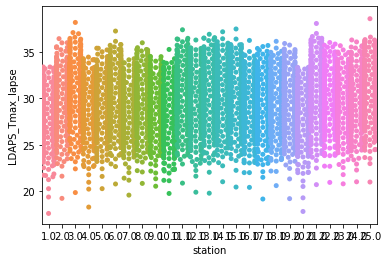

In [29]:
#Now plotting LDAPS_Tmax_lapse by station:
sns.swarmplot(x="station", y='LDAPS_Tmax_lapse', data=train_data)

Ranges of LDAPS_Tmax_lapse when comparing different stations are similar in the same kind of range. Good!

Obviously we also have outliers in some cases!

/srv/conda/envs/notebook/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 80.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/srv/conda/envs/notebook/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 81.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/srv/conda/envs/notebook/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 78.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/srv/conda/envs/notebook/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 81.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/srv/conda/envs/notebook/lib/python3.7/site-packages/seaborn/cat

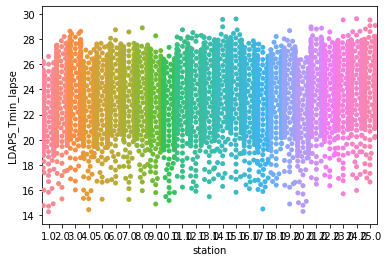

In [30]:
sns.swarmplot(x="station", y='LDAPS_Tmin_lapse', data=train_data)

Same here: Ranges of LDAPS_Tmin_lapse when comparing different stations are similar in the same kind of range. Good!

Obviously we also have outliers in some cases!

In [31]:
#Let's now analize our data types alongside with the nulls and number if cases and our dataframe shape:

print('Getting the info: ')
print(train_data.info())

Getting the info: 
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7752 entries, 0 to 7751
Data columns (total 28 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   station           7750 non-null   float64       
 1   Date              7750 non-null   datetime64[ns]
 2   Present_Tmax      7682 non-null   float64       
 3   Present_Tmin      7682 non-null   float64       
 4   LDAPS_RHmin       7677 non-null   float64       
 5   LDAPS_RHmax       7677 non-null   float64       
 6   LDAPS_Tmax_lapse  7677 non-null   float64       
 7   LDAPS_Tmin_lapse  7677 non-null   float64       
 8   LDAPS_WS          7677 non-null   float64       
 9   LDAPS_LH          7677 non-null   float64       
 10  LDAPS_CC1         7677 non-null   float64       
 11  LDAPS_CC2         7677 non-null   float64       
 12  LDAPS_CC3         7677 non-null   float64       
 13  LDAPS_CC4         7677 non-null   float64       
 14  LDAPS

As we se in the above code snippet, we have 7752 rows including headers and then 20 features columns.

We see some features hve missing values.

Great news is that all the features excluding the Date feature are float type, useful dtype for our maching learning algorithm insertion.

In [32]:
print('The stats of the data: ')
print(train_data.describe())

The stats of the data: 
           station  Present_Tmax  Present_Tmin  LDAPS_RHmin  LDAPS_RHmax  \
count  7750.000000   7682.000000   7682.000000  7677.000000  7677.000000   
mean     13.000000     29.768211     23.225059    56.759372    88.374804   
std       7.211568      2.969999      2.413961    14.668111     7.192004   
min       1.000000     20.000000     11.300000    19.794666    58.936283   
25%       7.000000     27.800000     21.700000    45.963543    84.222862   
50%      13.000000     29.900000     23.400000    55.039024    89.793480   
75%      19.000000     32.000000     24.900000    67.190056    93.743629   
max      25.000000     37.600000     29.900000    98.524734   100.000153   

       LDAPS_Tmax_lapse  LDAPS_Tmin_lapse     LDAPS_WS     LDAPS_LH  \
count       7677.000000       7677.000000  7677.000000  7677.000000   
mean          29.613447         23.512589     7.097875    62.505019   
std            2.947191          2.345347     2.183836    33.730589   
min    

In [33]:
#let's check the count of null values for each feature column:
train_data.isnull().sum()

station              2
Date                 2
Present_Tmax        70
Present_Tmin        70
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
Year                 2
Month                2
Day                  2
dtype: int64

In [34]:
train_data.head() #let's check our dataframe 

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,...,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Year,Month,Day
0,1.0,2013-06-30,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,0.203896,...,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2,2013.0,6.0,30.0
1,2.0,2013-06-30,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,0.251771,...,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5,2013.0,6.0,30.0
2,3.0,2013-06-30,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,0.209344,0.257469,...,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9,2013.0,6.0,30.0
3,4.0,2013-06-30,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,0.216372,0.226002,...,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3,2013.0,6.0,30.0
4,5.0,2013-06-30,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,0.151407,0.249995,...,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5,2013.0,6.0,30.0


In [35]:
#Get rid of the last 2 rows of the data as they don't have station and date info
train_data.drop(train_data.tail(2).index, inplace=True)

If we check our null values, seems of have a common pathern in all those columns with null values. So, let's check if the missing values are on the same rows indices:



In [37]:

#This gives the list of indices with null values
index_present_tmax= train_data['Present_Tmax'].index[train_data['Present_Tmax'].apply(np.isnan)]
index_present_tmin= train_data['Present_Tmin'].index[train_data['Present_Tmin'].apply(np.isnan)]

index_next_tmax   = train_data['Next_Tmax'].index[train_data['Next_Tmax'].apply(np.isnan)]
index_next_tmin   = train_data['Next_Tmin'].index[train_data['Next_Tmin'].apply(np.isnan)]

index_LDAPS_RHmax = train_data['LDAPS_RHmax'].index[train_data['LDAPS_RHmax'].apply(np.isnan)]
index_LDAPS_RHmin = train_data['LDAPS_RHmin'].index[train_data['LDAPS_RHmin'].apply(np.isnan)]
index_Tmax_lapse  = train_data['LDAPS_Tmax_lapse'].index[train_data['LDAPS_Tmax_lapse'].apply(np.isnan)]
index_Tmin_lapse  = train_data['LDAPS_Tmin_lapse'].index[train_data['LDAPS_Tmin_lapse'].apply(np.isnan)]
index_LDAPS_WS    = train_data['LDAPS_WS'].index[train_data['LDAPS_WS'].apply(np.isnan)]
index_LDAPS_LH    = train_data['LDAPS_LH'].index[train_data['LDAPS_LH'].apply(np.isnan)]
index_LDAPS_CC1   = train_data['LDAPS_CC1'].index[train_data['LDAPS_CC1'].apply(np.isnan)]
index_LDAPS_CC2   = train_data['LDAPS_CC2'].index[train_data['LDAPS_CC2'].apply(np.isnan)]
index_LDAPS_CC3   = train_data['LDAPS_CC3'].index[train_data['LDAPS_CC3'].apply(np.isnan)]
index_LDAPS_CC4   = train_data['LDAPS_CC4'].index[train_data['LDAPS_CC4'].apply(np.isnan)]
index_LDAPS_PPT1  = train_data['LDAPS_PPT1'].index[train_data['LDAPS_PPT1'].apply(np.isnan)]
index_LDAPS_PPT2  = train_data['LDAPS_PPT2'].index[train_data['LDAPS_PPT2'].apply(np.isnan)]
index_LDAPS_PPT3  = train_data['LDAPS_PPT3'].index[train_data['LDAPS_PPT3'].apply(np.isnan)]
index_LDAPS_PPT4  = train_data['LDAPS_PPT4'].index[train_data['LDAPS_PPT4'].apply(np.isnan)]


In [38]:

#Checking if the null values are at the same indices
if list(index_present_tmin) == list(index_present_tmax):
    print('Lists are identical')
else: print('Unidentical lists')

Lists are identical


In [39]:
if list(index_next_tmin) == list(index_next_tmax):
    print('Lists are identical')
else: print('Unidentical lists')

Lists are identical


In [40]:
if list(index_LDAPS_RHmin)==list(index_LDAPS_RHmax)==list(index_Tmin_lapse)==list(index_Tmax_lapse)==list(index_LDAPS_LH)==list(index_LDAPS_WS)==list(index_LDAPS_CC1)==list(index_LDAPS_CC2)==list(index_LDAPS_CC3)==list(index_LDAPS_CC4)==list(index_LDAPS_PPT1)==list(index_LDAPS_PPT2)==list(index_LDAPS_PPT3)==list(index_LDAPS_PPT4):
    print('Lists are identical')
else: print('Unidentical lists')

Lists are identical


In [7]:
train_data.isnull().sum()

station              2
Date                 2
Present_Tmax        70
Present_Tmin        70
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

In [8]:
train_data.shape

(7752, 25)

In [9]:
train_data.dropna(axis=0,inplace=True)

In [10]:
train_data.shape

(7588, 25)

In [11]:
train_data.isnull().sum()

station             0
Date                0
Present_Tmax        0
Present_Tmin        0
LDAPS_RHmin         0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_WS            0
LDAPS_LH            0
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT2          0
LDAPS_PPT3          0
LDAPS_PPT4          0
lat                 0
lon                 0
DEM                 0
Slope               0
Solar radiation     0
Next_Tmax           0
Next_Tmin           0
dtype: int64

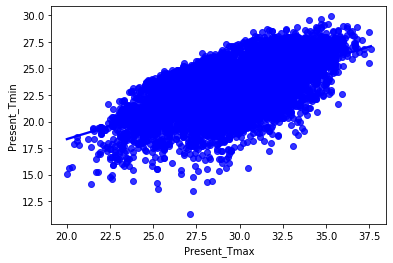

In [46]:
# Scatter plot between the min and max temperatures

sns.regplot(x = 'Present_Tmax', y = 'Present_Tmin', color="b", data = train_data)

As expected, the Present minimum temperature and Present maximum temperature has linear positive correlation and viceverse.

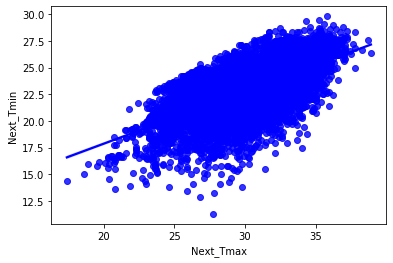

In [47]:
# Scatter plot between the min and max temperatures

sns.regplot(x = 'Next_Tmax', y = 'Next_Tmin', color="b", data = train_data)

Same here, Next minimum temperature and Next maximum temperature has linear positive correlation and viceverse.

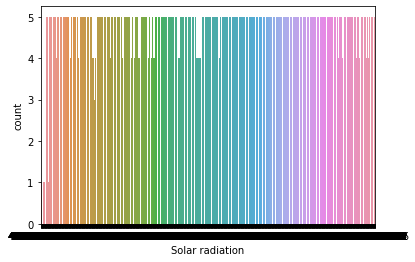

In [48]:
# Plot the SOLAR RADIATION :
sns.countplot(data = train_data, x='Solar radiation')
#From the above figure, 0 = No Rain and 1 = Rain¶

Not so many, we a have around 4 and 5 solar radiations.

In [49]:
#let's remenber the dataset columns:
train_data.columns

Index(['station', 'Date', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin',
       'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS',
       'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4',
       'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon',
       'DEM', 'Slope', 'Solar radiation', 'Next_Tmax', 'Next_Tmin', 'Year',
       'Month', 'Day'],
      dtype='object')

In [50]:
#and dtypes of each feature:
train_data.dtypes

station                    float64
Date                datetime64[ns]
Present_Tmax               float64
Present_Tmin               float64
LDAPS_RHmin                float64
LDAPS_RHmax                float64
LDAPS_Tmax_lapse           float64
LDAPS_Tmin_lapse           float64
LDAPS_WS                   float64
LDAPS_LH                   float64
LDAPS_CC1                  float64
LDAPS_CC2                  float64
LDAPS_CC3                  float64
LDAPS_CC4                  float64
LDAPS_PPT1                 float64
LDAPS_PPT2                 float64
LDAPS_PPT3                 float64
LDAPS_PPT4                 float64
lat                        float64
lon                        float64
DEM                        float64
Slope                      float64
Solar radiation            float64
Next_Tmax                  float64
Next_Tmin                  float64
Year                       float64
Month                      float64
Day                        float64
dtype: object


As we saw earlier, missing values in thoese columns are present at the same indexes
There are 25 stations, let's divide all the data according to the stations


In [52]:
no_of_stations = 25
station = [[] for _ in range(no_of_stations+1)]

for i in range(1,len(station)):
    station[i] = train_data.loc[train_data['station'] == i]

In [53]:
#filling all the nan values with the respective avrage as missing values are less
for i in range(1,len(station)):
    station[i] = station[i].fillna(station[i].mean())
    #station[i].set_index('Date', inplace=True)

/srv/conda/envs/notebook/lib/python3.7/site-packages/ipykernel_launcher.py:4: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  after removing the cwd from sys.path.


Text(0.5, 1.0, 'Geographical location of stations')

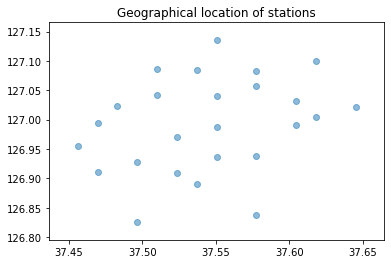

In [54]:
#now plotting the geographical locations of the stations from the latitude, longitude data
#and craeting a new dataframe to store all the latitudes and longitudes
new_data = pd.DataFrame(columns=['lat','lon'], index=range(0,25))
for i in range(0,25):
    new_data['lat'][i] = train_data['lat'][i]
    new_data['lon'][i] = train_data['lon'][i]
    
    
fig, ax = plt.subplots()
ax.scatter(new_data['lat'],new_data['lon'], alpha=0.5)
plt.title('Geographical location of stations')

/srv/conda/envs/notebook/lib/python3.7/site-packages/ipykernel_launcher.py:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  app.launch_new_instance()
/srv/conda/envs/notebook/lib/python3.7/site-packages/ipykernel_launcher.py:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  app.launch_new_instance()
/srv/conda/envs/notebook/lib/python3.7/site-packages/ipykernel_launcher.py:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and

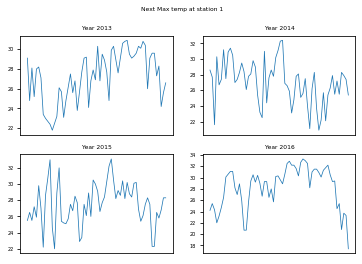

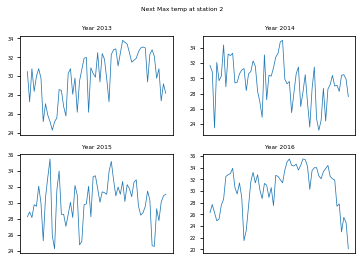

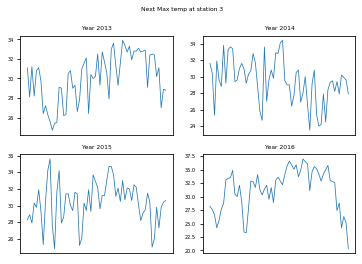

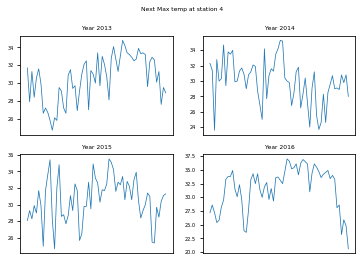

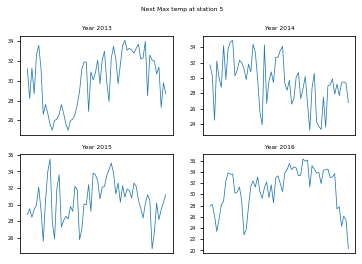

...

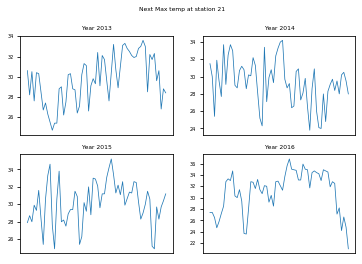

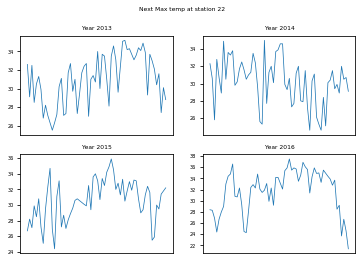

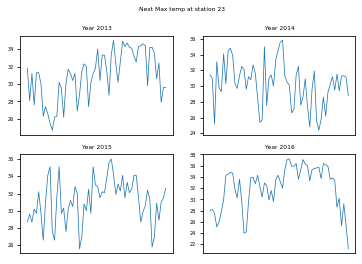

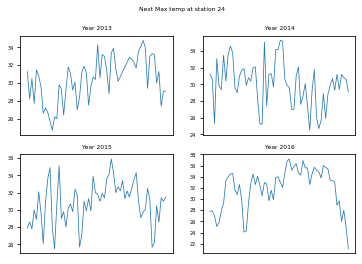

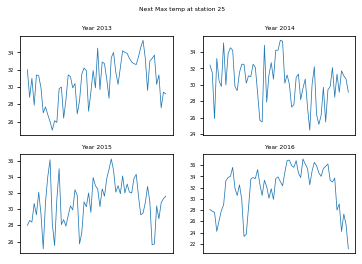

In [55]:
labels = [i for i in range(1,len(station))]
for i, txt in enumerate(labels):
    ax.annotate(txt, (new_data['lat'][i],new_data['lon'][i]))


'''
Visualizing the data
'''
#This shows the varaition of Present Max temp at a station throughout 2013 to 2016
for i in range(1,len(station)):

    plt.rcParams.update({'font.size': 5})
    ncols = 2
    nrows = 2
    
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols)
    fig.suptitle('Next Max temp at station {}'.format(i))
    years = [2013,2014,2015,2016]
    
    for ax, j in zip(axes.flatten(), years):
        ax.plot(station[i].loc[station[i]['Year']==j]['Next_Tmax'], linewidth=0.75)
        ax.title.set_text('Year {}'.format(j))
    
    for ax in axes.flatten():
        ax.set_xticks([])
        ax.tick_params(axis='y', labelsize=5)    

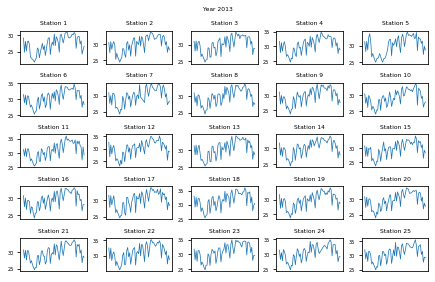

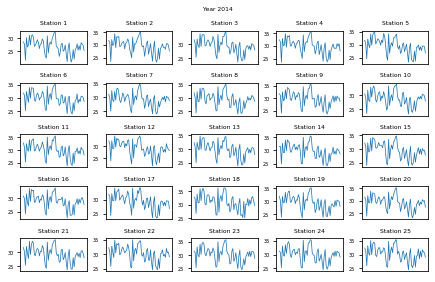

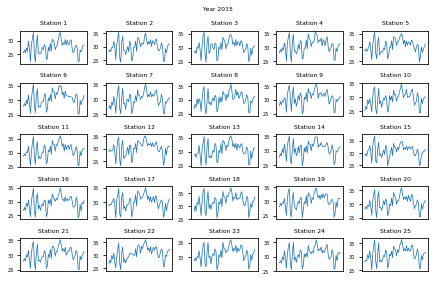

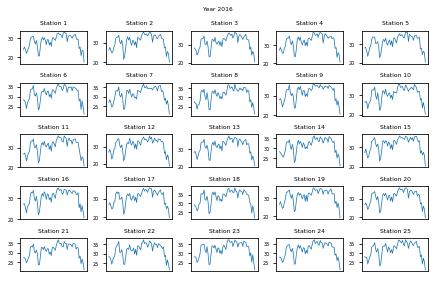

In [56]:
#This shows the variation of Present Max temp at all stations in a particular year
years = [2013,2014,2015,2016]
for j in years:
    
    #plt.rcParams.update({'font.size:5'})
    ncols = 5
    nrows = 5
    
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols)
    fig.suptitle('Year {}'.format(j))
    i = range(1,26)
    
    for ax, i in zip(axes.flatten(), i):
        ax.plot(station[i].loc[station[i]['Year']==j]['Next_Tmax'], linewidth=0.75)
        ax.title.set_text('Station {}'.format(i))
        
    for ax in axes.flatten():
        ax.set_xticks([])
        ax.tick_params(axis='y', labelsize=5)
    
    fig.tight_layout(rect=[0, 0.03, 1, 0.95])
    #plt.tight_layout()
    
#From above, it can be seen that in a particular year, the trend shown by Present Max temp at 
#all stations looks to be same. Assuming that this is same with other temp trends also, let us 
#evaluate the Next_Tmax and Next_Tmin in 2017 

In [ ]:
#importing some  others libraries:
#linear algebra
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', 25)

#Plotting
import seaborn as sns
import matplotlib.pyplot as plt

#Feature Scaling
from sklearn.preprocessing import MinMaxScaler

#For Multivariate Linear Regression
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm

#K-Fold cross validation
from sklearn.model_selection import cross_val_score

/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/linear_model/least_angle.py:30: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  method='lar', copy_X=True, eps=np.finfo(np.float).eps,
/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/linear_model/least_angle.py:167: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  method

In [62]:
#now let's prepare the data for machine learning:
station=train_data

In [63]:
station = pd.DataFrame(station)

In [64]:
print(station[0:2])

   station       Date  Present_Tmax  Present_Tmin  LDAPS_RHmin  LDAPS_RHmax  \
0      1.0 2013-06-30          28.7          21.4    58.255688    91.116364   
1      2.0 2013-06-30          31.9          21.6    52.263397    90.604721   

   LDAPS_Tmax_lapse  LDAPS_Tmin_lapse  LDAPS_WS   LDAPS_LH  LDAPS_CC1  \
0         28.074101         23.006936  6.818887  69.451805   0.233947   
1         29.850689         24.035009  5.691890  51.937448   0.225508   

   LDAPS_CC2  ...  LDAPS_PPT3  LDAPS_PPT4      lat      lon       DEM   Slope  \
0   0.203896  ...         0.0         0.0  37.6046  126.991  212.3350  2.7850   
1   0.251771  ...         0.0         0.0  37.6046  127.032   44.7624  0.5141   

   Solar radiation  Next_Tmax  Next_Tmin    Year  Month   Day  
0      5992.895996       29.1       21.2  2013.0    6.0  30.0  
1      5869.312500       30.5       22.5  2013.0    6.0  30.0  

[2 rows x 28 columns]


In [14]:
station.drop(['Date'], axis=1,inplace=True)

In [67]:
station.columns

Index(['station', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin', 'LDAPS_RHmax',
       'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS', 'LDAPS_LH',
       'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4', 'LDAPS_PPT1',
       'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon', 'DEM', 'Slope',
       'Solar radiation', 'Next_Tmax', 'Next_Tmin', 'Year', 'Month', 'Day'],
      dtype='object')

In [68]:
#let's predict the Next_Tmax and Next_Tmin for 2016:
train = station.loc[station['Year']!=2016]  
valid = station.loc[station['Year']==2016]

train = train.drop(['station','lat','lon','DEM','Slope','Year','Month','Day'], axis=1)
valid = valid.drop(['station','lat','lon','DEM','Slope','Year','Month','Day'], axis=1)

X_train = train.iloc[:, :-2].values
Y_train_Tmax = train.iloc[:, [-2]].values
Y_train_Tmin = train.iloc[:, [-1]].values

X_test = valid.iloc[:, :-2].values
Y_test_Tmax = valid.iloc[:, [-2]].values
Y_test_Tmin = valid.iloc[:, [-1]].values

In [69]:

#Normalizing the data
scaler = MinMaxScaler(feature_range=(0,1))
scaler.fit(X_train)
X_train = scaler.transform(X_train)
X_test  = scaler.transform(X_test)



In [70]:
#checking if there is null, if so, then print it:
for element in X_train:
    if type(element) == float and pd.isna(element):
        print('null')

In [71]:
#3rounding to 3 digits the decimal of x_train:
X_train = [np.round(x,3) for x in X_train]

In [72]:
#checking nan values:
np.any(np.isnan(X_train))

False

In [73]:
#converting the X_train to a dataframe:
X_train = pd.DataFrame(X_train)

In [74]:
#starting modeling and doing the learning of machine algorithms:
 #and checking their correspondent acuracies:

regressor_max = LinearRegression()
regressor_max.fit(X_train, Y_train_Tmax)

regressor_min = LinearRegression()
regressor_min.fit(X_train, Y_train_Tmin)

Y_pred_Tmax  = regressor_max.predict(X_test)
Y_pred_Tmin  = regressor_min.predict(X_test)
#Y_pred_train = regressor.predict(X_train)

#K-fold cross validation
accuracies_max = cross_val_score(estimator = regressor_max, X = X_train, y = Y_train_Tmax, cv = 10)
acc_mean_max = accuracies_max.mean()
acc_std_max  = accuracies_max.std()


accuracies_min = cross_val_score(estimator = regressor_min, X = X_train, y = Y_train_Tmin, cv = 10)
acc_mean_min = accuracies_min.mean()
acc_std_min  = accuracies_min.std()

kfold = {'acc_mean_max':acc_mean_max, 'acc_std_max':acc_std_max,
         'acc_mean_min':acc_mean_min, 'acc_std_min':acc_std_min}



/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  fold_sizes = np.full(n_splits, n_samples // n_splits, dtype=np.int)
/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Depreca

In [75]:
!pip install lxml 

In [76]:
#chekcing the results and pvalues for the maximum accuracy:

import lxml 
#Backelimination for Tmax
X_train_mul = np.append(arr = np.ones((X_train.shape[0], 1)).astype(int), values = X_train, axis = 1)
sl = 0.05
arr_max = []
get_arr_max = []
for i in range(0, X_train.shape[1]):
    arr_max.append(i)

def backElimination_Tmax(X, arr, get_arr):
    
    X_opt = X[:, arr]
    regressor_OLS = sm.OLS(endog = Y_train_Tmax, exog = X_opt).fit()
    results_summary = regressor_OLS.summary()

    results_as_html = results_summary.tables[1].as_html()
    train_datas = pd.read_html(results_as_html, header=0, index_col=0)[0]

    p_value =  train_datas.iloc[:, 3]
    p_value_arr = p_value.tolist()
    pop_item = False
    maxpos  = p_value_arr.index(max(p_value_arr))
    if(p_value_arr[maxpos]>sl):
        get_arr.append(arr[maxpos])
        arr.pop(maxpos)
        pop_item = True
    
    if(pop_item): return backElimination_Tmax(X, arr, get_arr)
    else: 
        get_arr.sort()
        return results_summary      
      
summary_max = backElimination_Tmax(X_train_mul, arr_max, get_arr_max)

acc_max = round(regressor_max.score(X_train, Y_train_Tmax)*100, 2)

In [77]:
#Backelimination for Tmin
X_train_mul = np.append(arr = np.ones((X_train.shape[0], 1)).astype(int), values = X_train, axis = 1)
sl = 0.05
arr_min = []
get_arr_min = []
for i in range(0, X_train.shape[1]):
    arr_min.append(i)

def backElimination_Tmin(X, arr, get_arr):
    
    X_opt = X[:, arr]
    regressor_OLS = sm.OLS(endog = Y_train_Tmin, exog = X_opt).fit()
    results_summary = regressor_OLS.summary()

    results_as_html = results_summary.tables[1].as_html()
    train_datas = pd.read_html(results_as_html, header=0, index_col=0)[0]

    p_value =  train_datas.iloc[:, 3]
    p_value_arr = p_value.tolist()
    pop_item = False
    maxpos  = p_value_arr.index(max(p_value_arr))
    if(p_value_arr[maxpos]>sl):
        get_arr.append(arr[maxpos])
        arr.pop(maxpos)
        pop_item = True
    
    if(pop_item): return backElimination_Tmax(X, arr, get_arr)
    else: 
        get_arr.sort()
        return results_summary      
      
summary_min = backElimination_Tmin(X_train_mul, arr_min, get_arr_min)

acc_min = round(regressor_min.score(X_train, Y_train_Tmin)*100, 2)

In [78]:

#Accuracies for Tmax and Tmin
acc = {'Tmax accuarcy':acc_max, 'Tmin_accuracy':acc_min}

Y_pred_Tmax = pd.DataFrame(Y_pred_Tmax)
Y_pred_Tmin = pd.DataFrame(Y_pred_Tmin)

Y_pred_Tmax.columns = ['Predicted Next_Tmax']
Y_pred_Tmin.columns = ['Predicted Next_Tmin']

Y_pred = pd.concat([Y_pred_Tmax, Y_pred_Tmin], axis=1, join='inner')
test = valid
test.index = [i for i in range(0,len(test))]

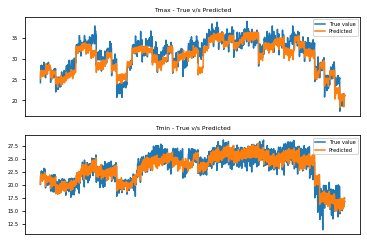

In [79]:


#plotting the results
nrows = 2
ncols = 1
fig, (ax1,ax2) = plt.subplots(nrows=nrows, ncols=ncols)

ax1.plot(test['Next_Tmax'], label='True value')
ax1.plot(Y_pred['Predicted Next_Tmax'], label='Predicted')
ax1.title.set_text('Tmax - True v/s Predicted')
ax1.set_xticks([])
ax1.tick_params(axis='y', labelsize=5)
ax1.legend(loc='upper right')

ax2.plot(test['Next_Tmin'], label='True value')
ax2.plot(Y_pred['Predicted Next_Tmin'], label='Predicted')
ax2.title.set_text('Tmin - True v/s Predicted')
ax2.set_xticks([])
ax2.tick_params(axis='y', labelsize=5)
ax2.legend(loc='upper right')

This Multiple Linear Regression model has an accuracy of around 35% for predicting Next_Tmax and
around 27,5% accuracy for predicting Next_Tmin.
This model can't be applied for the data we have and for future minimum and maximum temperature.

In [81]:
#importing the libraries in casee:
#linear algebra
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', 25)

#Plotting
import seaborn as sns
import matplotlib.pyplot as plt

#Feature Scaling
from sklearn.preprocessing import MinMaxScaler

#Multiple Linear Regression
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm

#K-Fold cross validation
from sklearn.model_selection import cross_val_score

In [82]:
#using other's defined very useful funstions to do the same such as the training and validation data:

def get_train_valid(station):
    
    train = station.loc[station['Year']!=2017] 
    valid = station.loc[station['Year']==2017]
    
    train = train.drop(['Date','station','lat','lon','DEM','Slope','Year','Month','Day'], axis=1)
    valid = valid.drop(['Date','station','lat','lon','DEM','Slope','Year','Month','Day'], axis=1)
    
    return train, valid


In [83]:
#also for scaling:
def scale(X_train, X_test):
    
    scaler = MinMaxScaler(feature_range=(0,1))
    scaler.fit(X_train)
    X_train = scaler.transform(X_train)
    X_test  = scaler.transform(X_test)
    
    return X_train, X_test

In [84]:
#also for backELimination:
def backElimination(X, Y_train, arr, get_arr):
    
    X_opt = X[:, arr]
    regressor_OLS = sm.OLS(endog = Y_train, exog = X_opt).fit()
    results_summary = regressor_OLS.summary()

    results_as_html = results_summary.tables[1].as_html()
    train_datas = pd.read_html(results_as_html, header=0, index_col=0)[0]

    p_value =  train_datas.iloc[:, 3]
    p_value_arr = p_value.tolist()
    pop_item = False
    maxpos  = p_value_arr.index(max(p_value_arr))
    if(p_value_arr[maxpos]>sl):
        get_arr.append(arr[maxpos])
        arr.pop(maxpos)
        pop_item = True
    
    if(pop_item): return backElimination(X, Y_train, arr, get_arr)
    else: 
        get_arr.sort()        
        return results_summary

In [85]:
#for plotting:
def plot(Y_pred_Tmax, Y_pred_Tmin, valid, iter_no):
    
    Y_pred_Tmax = pd.DataFrame(Y_pred_Tmax)
    Y_pred_Tmin = pd.DataFrame(Y_pred_Tmin)
    
    Y_pred_Tmax.columns = ['Predicted Next_Tmax']
    Y_pred_Tmin.columns = ['Predicted Next_Tmin']
    
    Y_pred = pd.concat([Y_pred_Tmax, Y_pred_Tmin], axis=1, join='inner')
    test = valid
    test.index = [k for k in range(0,len(test))]    
    
    

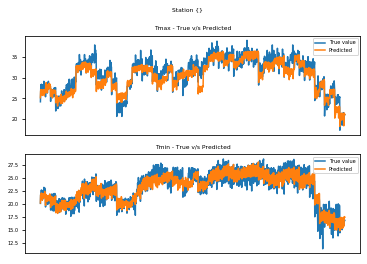

In [86]:
    #now plotting the results
    nrows = 2
    ncols = 1
    fig, (ax1,ax2) = plt.subplots(nrows=nrows, ncols=ncols)
    fig.suptitle('Station {}')#.format(iter_no))
    
    ax1.plot(test['Next_Tmax'], label='True value')
    ax1.plot(Y_pred['Predicted Next_Tmax'], label='Predicted')
    ax1.title.set_text('Tmax - True v/s Predicted')
    ax1.set_xticks([])
    ax1.tick_params(axis='y', labelsize=5)
    ax1.legend(loc='upper right')
    
    ax2.plot(test['Next_Tmin'], label='True value')
    ax2.plot(Y_pred['Predicted Next_Tmin'], label='Predicted')
    ax2.title.set_text('Tmin - True v/s Predicted')
    ax2.set_xticks([])
    ax2.tick_params(axis='y', labelsize=5)
    ax2.legend(loc='upper right')

Okay, so yeah, this works correctly as it is showing the same results as previously commented!

In [87]:
 #so, now, we will take also the model building definition (created by another colleague) and use it to build our model and analize the  results we get:
    #fig.tight_layout(rect=[0, 0.03, 1, 0.95])   

def build_model(X_train, Y_train, X_test, sl):
    
        regressor = LinearRegression()
        regressor.fit(X_train, Y_train)

        Y_pred  = regressor.predict(X_test)

        accuracies = cross_val_score(estimator = regressor, X = X_train, y = Y_train, cv = 10)
        acc_mean = accuracies.mean()
        acc_std  = accuracies.std()

        kfold = {'acc_mean':acc_mean, 'acc_std':acc_std}

        X_train_mul = np.append(arr = np.ones((X_train.shape[0], 1)).astype(int), values = X_train, axis = 1)
        arr = []
        get_arr = []
        for i in range(0, X_train.shape[1]):
            arr.append(i)

        summary = backElimination(X_train_mul, Y_train, arr, get_arr)

        acc = round(regressor.score(X_train, Y_train)*100, 2)

        return summary, acc, Y_pred    



In [88]:
#now the following one will be used to run the model, fine:

def run(station, sl, iter_no):
    
    train, valid = get_train_valid(station)
    
    X_train = train.iloc[:, :-2].values
    Y_train_Tmax = train.iloc[:, [-2]].values
    Y_train_Tmin = train.iloc[:, [-1]].values
    
    X_test = valid.iloc[:, :-2].values
    Y_test_Tmax = valid.iloc[:, [-2]].values
    Y_test_Tmin = valid.iloc[:, [-1]].values
    
    scaled_X_trian, scaled_X_test = scale(X_train, X_test) #Returns the scaled values of X_train and X_test
    
    summary_max, acc_max, Y_pred_Tmax = build_model(scaled_X_trian, Y_train_Tmax, scaled_X_test, sl)
    summary_min, acc_min, Y_pred_Tmin = build_model(scaled_X_trian, Y_train_Tmin, scaled_X_test, sl)
    
    summ = [summary_max, summary_min]
    a  = [acc_max, acc_min]
    
    #Plotting True v's Predicted values
    plot(Y_pred_Tmax, Y_pred_Tmin, valid, iter_no)
    
    return summ, a


In [89]:
#There are 25 stations, dividing data into respective stations
station_info = [[] for _ in range(26)]
    
for i in range(1,26):
    station_info[i] = train_data.loc[train_data['station'] == i]    
    
    #All the columns are float64 and since the std. deviaiton is less and the total no. of
    #missing values are les, filling all the nan values with the respective column avg.
for i in range(1,26):
        station_info[i] = station_info[i].fillna(station_info[i].mean())
        #station[i].set_index('Date', inplace=True)
        
targets  = ['Next_Tmax','Next_Tmin']
features = ['Present_Tmax','Present_Tmin','LDAPS_RHmax','LDAPS_RHmin','LDAPS_Tmax_lapse',
                'LDAPS_Tmin_lapse','LDAPS_WS','LDAPS_LH','LDAPS_CC1','LDAPS_CC2','LDAPS_CC3',
                'LDAPS_CC4','LDAPS_PPT1','LDAPS_PPT2','LDAPS_PPT3','LDAPS_PPT4']
    
acc = [i for i in range(0,len(station_info))] #To store accuracy values
summary = [j for j in range(0,len(station_info))] #To store summary of the model
sl = 0.05
     #Converting summary list to DataFrame object   
for iter_no in range(1,len(station_info)):  
        
        summary[iter_no], acc[iter_no] = run(station_info[iter_no], sl, iter_no)
    
    #Converting summary list to DataFrame object
summary[0] = [0,0]
summary_train_data = pd.DataFrame(summary, columns=['Next_Tmax','Next_Tmin'])
summary_train_data['Station'] = summary_train_data.index

cols = summary_train_data.columns.to_list()
cols = cols[-1:] + cols[:-1]

summary_train_data = summary_train_data[cols]
summary_train_data.drop(summary_train_data.head(1).index, inplace=True)
summary_train_data.index = range(0,len(summary_train_data))

#Converting accuracy list to DataFrame object  
acc[0] = [0,0]
acc_train_data = pd.DataFrame(acc, columns=['Next_Tmax','Next_Tmin'])
acc_train_data['Station'] = acc_train_data.index

cols = acc_train_data.columns.to_list()
cols = cols[-1:] + cols[:-1]

acc_train_data = acc_train_data[cols]
acc_train_data.drop(acc_train_data.head(1).index, inplace=True)
acc_train_data.index = range(0,len(acc_train_data))
#Accuracy of predictions
print('Accuracy at individual station is: ')
print(acc_train_data)
print() #h-space
    
print('Avg accuracy for Next_Tmax is: {}'.format(acc_train_data['Next_Tmax'].mean()))
print('Avg accuracy for Next_Tmin is: {}'.format(acc_train_data['Next_Tmin'].mean()))

  

/srv/conda/envs/notebook/lib/python3.7/site-packages/ipykernel_launcher.py:10: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  # Remove the CWD from sys.path while we load stuff.
/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  fold_sizes = np.full(n_splits, n_samples // n_splits, dtype=np.int)
/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_se

Accuracy at individual station is: 
    Station  Next_Tmax  Next_Tmin
0         1      81.90      86.92
1         2      82.07      86.93
2         3      81.44      86.65
3         4      81.52      86.59
4         5      78.26      84.94
5         6      81.62      85.27
6         7      81.30      83.40
7         8      83.40      85.75
8         9      78.97      83.13
9        10      81.78      84.63
10       11      80.90      83.83
11       12      80.29      86.39
12       13      80.40      87.92
13       14      80.91      83.58
14       15      77.89      86.08
15       16      79.92      84.76
16       17      80.10      87.09
17       18      79.46      84.61
18       19      80.51      86.46
19       20      82.60      85.26
20       21      81.62      84.96
21       22      79.73      84.08
22       23      82.06      82.75
23       24      82.49      83.34
24       25      82.32      85.04

Avg accuracy for Next_Tmax is: 80.93839999999999
Avg accuracy for Next_Tmin is:

So, yes, we got the accuracy of 80.93% on Next maximum temperature and 85,21% on the next minimum temperature. So, good are these accuracies but we will try with another machine learning algorithms in a different way in order to achieve better results than previous ones where you used others defined function. So, let's start creating and try to get better results. Let's start:

In [97]:
train_data.columns

Index(['station', 'Date', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin',
       'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS',
       'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4',
       'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon',
       'DEM', 'Slope', 'Solar radiation', 'Next_Tmax', 'Next_Tmin', 'Year',
       'Month', 'Day'],
      dtype='object')

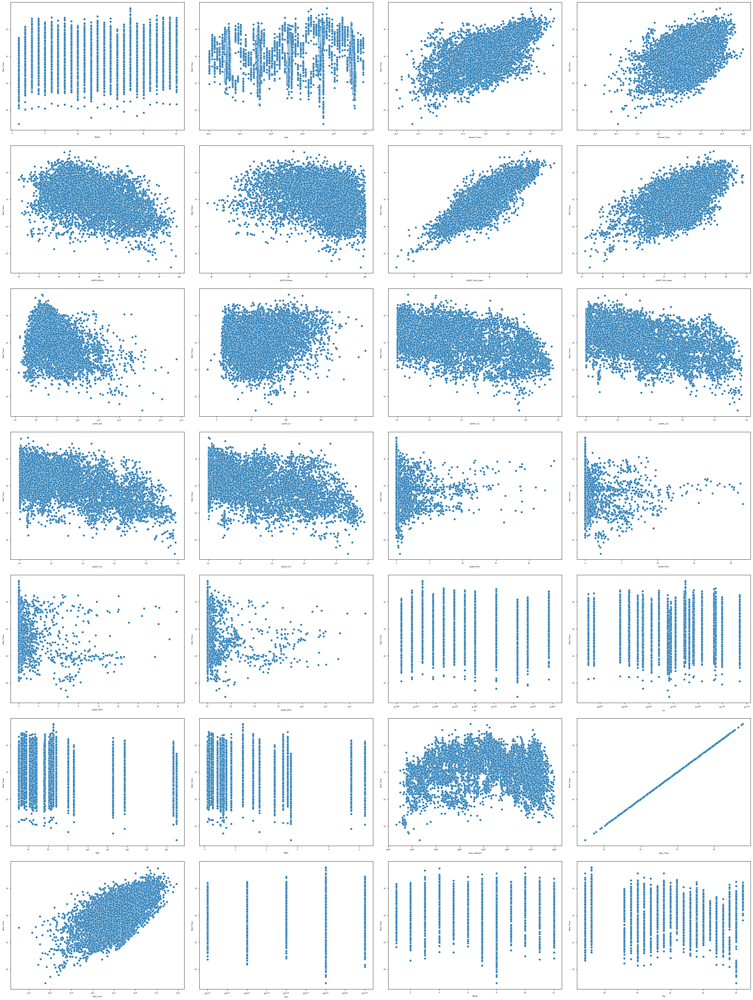

In [98]:
#Next Tmax in relation to other features:
c=1
plt.figure(figsize=(30,45))
for i in train_data:
    plt.subplot(8,4,c)
    sns.scatterplot(x =train_data[i], y=train_data.Next_Tmax)
    plt.xticks(rotation=10)
    plt.tight_layout(pad=4)
    c=c+1
plt.show()

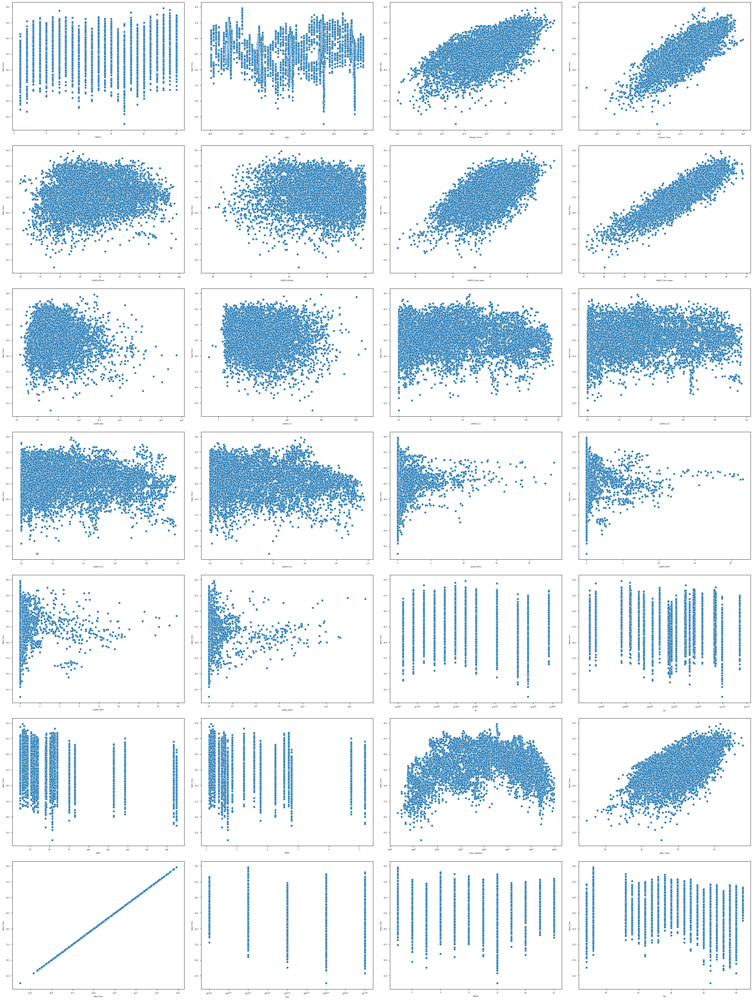

In [99]:
#Next Tmin in relation to other features:
c=1
plt.figure(figsize=(30,45))
for i in train_data:
    plt.subplot(8,4,c)
    sns.scatterplot(x =train_data[i], y=train_data.Next_Tmin)
    plt.xticks(rotation=10)
    plt.tight_layout(pad=4)
    c=c+1
plt.show()

As commented previously, we have around 5 features of temperatures that have linear relation and can be compared the impact of such features.

/srv/conda/envs/notebook/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


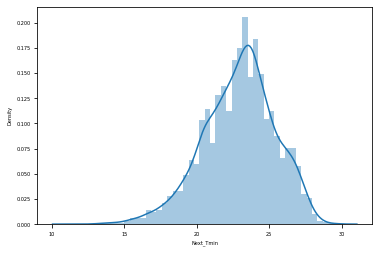

In [100]:
#Distibution of ‘Next Minimum temperature’ column:
sns.distplot(train_data.Next_Tmin)

We have a bit of left skewness as initially commented.

/srv/conda/envs/notebook/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


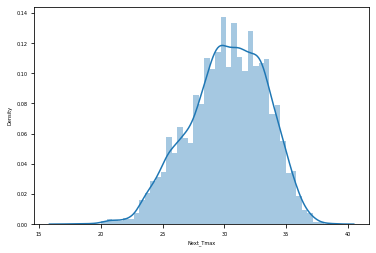

In [101]:
#Distibution of ‘Next Maximum temperature’ column:
sns.distplot(train_data.Next_Tmax)

We have a bit of left skewness as well.

In [102]:
#now defining the function of ploting as previous one:
def plot(train_data,col):
    fig,(ax1,ax2)=plt.subplots(2,1)
    sns.distplot(train_data[col],ax=ax1)
    sns.boxplot(train_data[col],ax=ax2)

In [104]:
train_data.columns

Index(['station', 'Date', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin',
       'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS',
       'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4',
       'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon',
       'DEM', 'Slope', 'Solar radiation', 'Next_Tmax', 'Next_Tmin', 'Year',
       'Month', 'Day'],
      dtype='object')

In [116]:
#plotting:
c=1
plt.figure(figsize=(30,45))

for col in train_data.columns:
    if train_data.columns is not 'Date':
        if train_data.dtypes is 'float64':
            plot(train_data,col)
            plt.show()

<Figure size 2160x3240 with 0 Axes>

In [ ]:
c=1
plt.figure(figsize=(30,45))

Median plays a very significant role wherever we have outliers. So we will use ‘where’ function to replace all the columns with price>4000 with the median value.

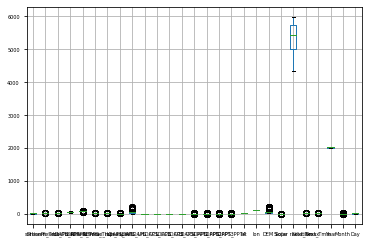

In [118]:
#We now plot boxplots to check the presence of outliers in our data
train_data.boxplot()


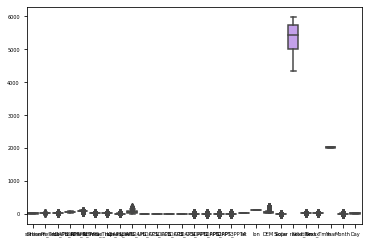

In [119]:
#outliers:
sns.boxplot(data=train_data)

station                AxesSubplot(0.125,0.749828;0.0824468x0.130172)
Present_Tmax        AxesSubplot(0.223936,0.749828;0.0824468x0.130172)
Present_Tmin        AxesSubplot(0.322872,0.749828;0.0824468x0.130172)
LDAPS_RHmin         AxesSubplot(0.421809,0.749828;0.0824468x0.130172)
LDAPS_RHmax         AxesSubplot(0.520745,0.749828;0.0824468x0.130172)
LDAPS_Tmax_lapse    AxesSubplot(0.619681,0.749828;0.0824468x0.130172)
LDAPS_Tmin_lapse    AxesSubplot(0.718617,0.749828;0.0824468x0.130172)
LDAPS_WS            AxesSubplot(0.817553,0.749828;0.0824468x0.130172)
LDAPS_LH               AxesSubplot(0.125,0.593621;0.0824468x0.130172)
LDAPS_CC1           AxesSubplot(0.223936,0.593621;0.0824468x0.130172)
LDAPS_CC2           AxesSubplot(0.322872,0.593621;0.0824468x0.130172)
LDAPS_CC3           AxesSubplot(0.421809,0.593621;0.0824468x0.130172)
LDAPS_CC4           AxesSubplot(0.520745,0.593621;0.0824468x0.130172)
LDAPS_PPT1          AxesSubplot(0.619681,0.593621;0.0824468x0.130172)
LDAPS_PPT2          

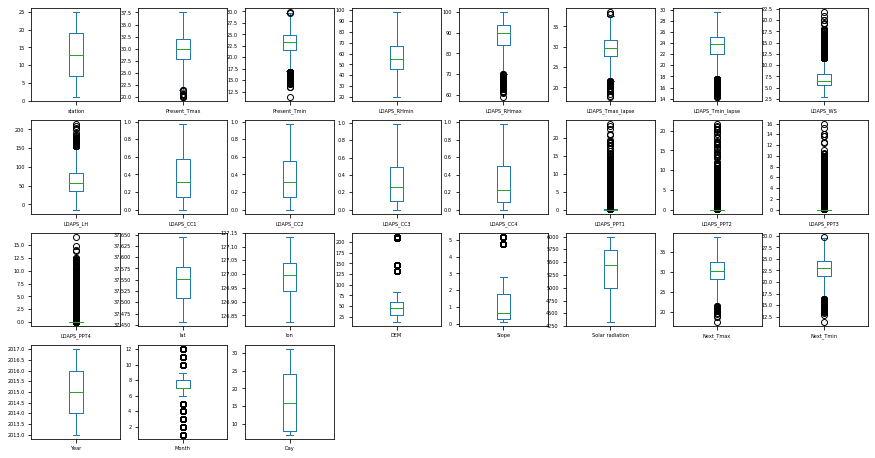

In [120]:
#plotting the boxplot for each column in order to check the outliers 
train_data.plot(kind='box',subplots = True,layout=(5,8),figsize = (15,10))

Breif below conclusion:
- Outliers are present in almost all features except features station, LDAPS_RHmin, LDAPS_CC*, lat, lon, Solar radiation and Year and Day.
- We will not remove outliers as we will see in the following steps as the number of outliers is higher than 10% of the total data we have.

In [121]:
train_data.columns

Index(['station', 'Date', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin',
       'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS',
       'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4',
       'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon',
       'DEM', 'Slope', 'Solar radiation', 'Next_Tmax', 'Next_Tmin', 'Year',
       'Month', 'Day'],
      dtype='object')

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f6fc98dd490>,
      dtype=object)

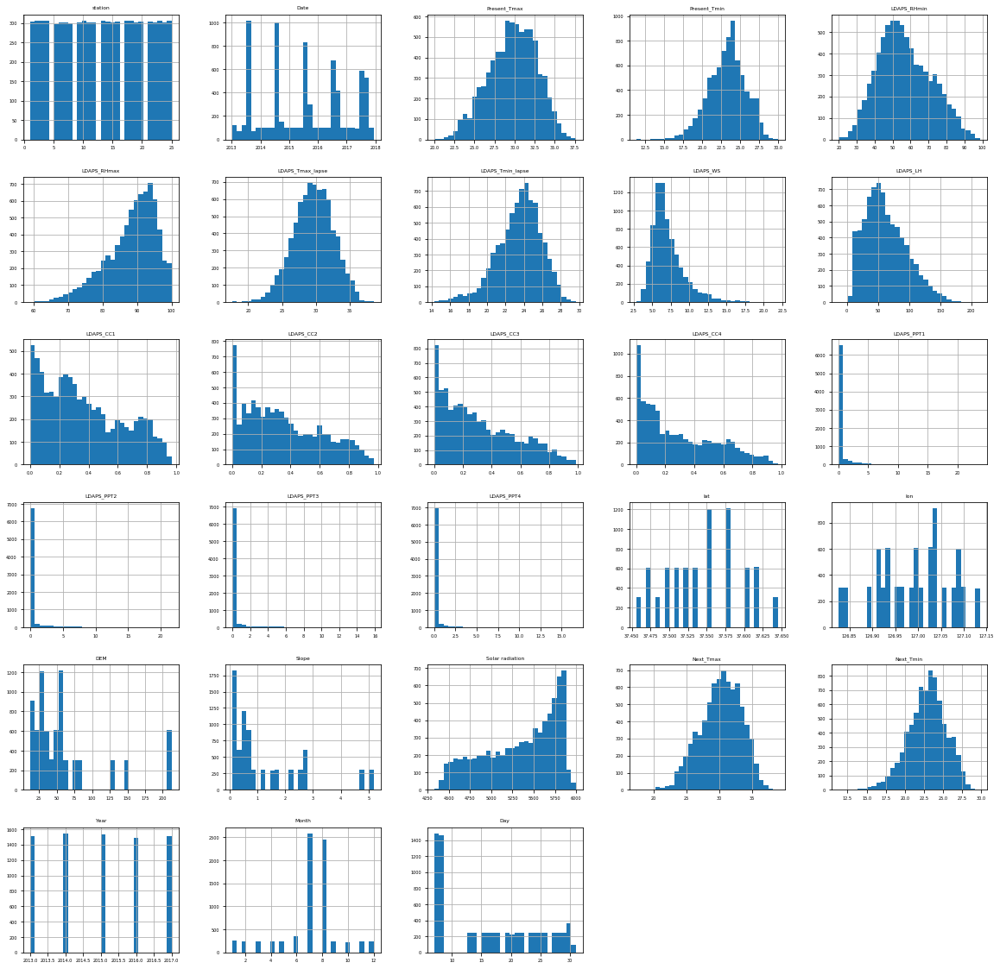

In [122]:
'''Histogram : to see the numeric data distribution'''
train_data.hist(figsize=(20,20), grid = True, bins = 30)

As we already previously mentioned, we have some skewness in almost all of ourcolumns.

In [123]:
#we see skewness in the above grafs. so, let's go and select numerical columns. as we said, all the columns excluding the target date are numerical columns
nf = train_data.select_dtypes(include=[np.number]).columns
nf

Index(['station', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin', 'LDAPS_RHmax',
       'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS', 'LDAPS_LH',
       'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4', 'LDAPS_PPT1',
       'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon', 'DEM', 'Slope',
       'Solar radiation', 'Next_Tmax', 'Next_Tmin', 'Year', 'Month', 'Day'],
      dtype='object')

In [124]:
#let's check skewness
from scipy.stats import skew
train_data=train_data
skew_list = skew(train_data[nf],nan_policy='omit') #sending all numericalfeatures and omitting nan values
skew_list_train_data = pd.concat([pd.DataFrame(nf,columns=['Features']),pd.DataFrame(skew_list,columns=['Skewness'])],axis = 1)

In [125]:
skew_list_train_data.sort_values(by='Skewness', ascending = False)

,Features,Skewness
16,LDAPS_PPT4,6.679935
15,LDAPS_PPT3,6.355414
14,LDAPS_PPT2,5.709231
13,LDAPS_PPT1,5.304857
19,DEM,1.721276
20,Slope,1.558742
7,LDAPS_WS,1.553619
12,LDAPS_CC4,0.663684
8,LDAPS_LH,0.662840
11,LDAPS_CC3,0.639523


In [17]:
train_data.isnull().sum()

station             0
Date                0
Present_Tmax        0
Present_Tmin        0
LDAPS_RHmin         0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_WS            0
LDAPS_LH            0
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT2          0
LDAPS_PPT3          0
LDAPS_PPT4          0
lat                 0
lon                 0
DEM                 0
Slope               0
Solar radiation     0
Next_Tmax           0
Next_Tmin           0
Year                0
Month               0
Day                 0
dtype: int64

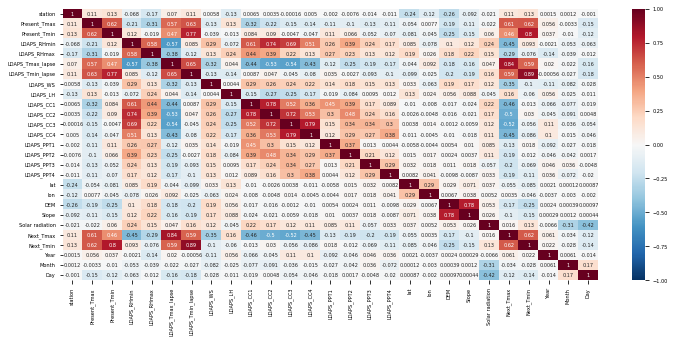

In [129]:
#Corelation between features/variables:¶
correlation = train_data.corr()
plt.figure(figsize=(12, 5))
sns.heatmap(correlation, annot=True, linewidths=0, vmin=-1, cmap="RdBu_r")

If we check our targets Next Tmin and Next Tmax correlations, we easily see that Present Tmin, Present Tmin, LDAPS Tmin lapse and LDAPS Tmax lapse are highly correlated as expected.   

In second place, after those 4 mainly correlated features, we have variales LDAPS RHmin and LDAPS RHmax which are alse correlated in relatively important proportion if we compare with others corraltions with regards the targets.

Then, we also have LDAPS_CC* which are correlated in average higher proportion with target Next maximum temperature compared to others. But not that much correlated with target Next minimum temperature.

If we compare others features than our target, we can highlight that in summary all the different minimums are somehow correlated to their corresponding maximums and viceverse.

Now let's drop Date as it is datetype feature and check if we can drop the outliers we have:

In [22]:
train_data.drop('Date', axis=1, inplace=True)

In [136]:
#Checking the outliers and removing them:
from scipy.stats import zscore
import numpy as np
train_data=train_data
z=np.abs(zscore(train_data))
z.shape

(7588, 27)

In [137]:
threhold=3
print(np.where(z>3))

(array([  25,   25,   26, ..., 7581, 7582, 7582]), array([ 7, 14, 14, ...,  2,  2,  6]))


In [138]:
#checking the dataset shape (with outliers and without outliers)
train_data_new=train_data[(z<3).all(axis=1)]
print(train_data.shape)
print(train_data_new.shape)

(7588, 27)
(6739, 27)


In [142]:
#Percentage of data loss:
loss_perc=(7588-6739)/(7588)
loss_perc #since the loss> 10%, so we cant proceed with removing the outliers.

0.11188719030047443

In [21]:
train_data_new.columns

Index(['station', 'Date', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin',
       'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS',
       'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4',
       'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon',
       'DEM', 'Slope', 'Solar radiation', 'Next_Tmax', 'Next_Tmin', 'Year',
       'Month', 'Day'],
      dtype='object')

In [23]:
#Now let's split the data by features (X, all except Next_Tmin and Next_Tmax columns) and target outcome (Y_Tmin and Y_Tmax which corresponds to Next_Tmin and Next_Tmax columns respectively)
train_data_new=train_data
X=train_data_new.drop(['Next_Tmin','Next_Tmax'],axis=1)
Y_Tmin=train_data_new['Next_Tmin']
Y_Tmax=train_data_new['Next_Tmax']

In [24]:
#Transforming the data to remove the skewness:
from sklearn.preprocessing import power_transform
x=power_transform(X,method='yeo-johnson')

In [25]:
#now we will standardrize the data 
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
x=sc.fit_transform(x)
x

array([[-1.85793136, -0.40014321, -0.78589419, ..., -1.2759071 ,
        -0.57581748,  1.4240063 ],
       [-1.64707819,  0.70965228, -0.70806284, ..., -1.2759071 ,
        -0.57581748,  1.4240063 ],
       [-1.45438283,  0.60075018, -0.0140243 , ..., -1.2759071 ,
        -0.57581748,  1.4240063 ],
       ...,
       [ 1.3101266 , -2.01375687, -2.26761853, ...,  1.63689845,
         0.36951245,  1.4240063 ],
       [ 1.42520815, -2.01375687, -2.08263413, ...,  1.63689845,
         0.36951245,  1.4240063 ],
       [ 1.53907899, -2.04057179, -2.17599925, ...,  1.63689845,
         0.36951245,  1.4240063 ]])

In [25]:
#now we will check multicolinearity via VIF:
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

X = train_data_new[list(train_data_new.columns[:-2])]

vif_info = pd.DataFrame()
vif_info['VIF'] = [variance_inflation_factor(x, i) for i in range(X.shape[1])]
vif_info['Column'] = X.columns
vif_info.sort_values('VIF', ascending=False)

,VIF,Column
6,7.249667,LDAPS_Tmin_lapse
5,7.166593,LDAPS_Tmax_lapse
3,6.124121,LDAPS_RHmin
10,5.669318,LDAPS_CC2
11,5.151539,LDAPS_CC3
9,4.719598,LDAPS_CC1
19,3.291525,DEM
2,3.193166,Present_Tmin
12,3.063050,LDAPS_CC4
1,2.959030,Present_Tmax


In [26]:
#so we do not have multicolinearity as the VIF values are low. Good!

In [26]:
#Modeling

#We now proceed to the main step of our machine learning: splitting, fitting the model and predicting the outputs. We fit the data into multiple regression models to compare the performance of all models and select the best model –

#for machine learning algorithms, let's import necssary libraries:

from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_absolute_error,mean_squared_error

In [29]:
#split data in training and testing 
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(x, Y_Tmax, test_size=0.25, random_state=0)


In [66]:
#Building Machine Learning Models for target TMIN first and once i get the best model for it, will aplly the same steps on targeting tehe TMAX depending on the results i get for TMAX  :)
from sklearn.linear_model import LinearRegression
lr=LinearRegression()
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split
for i in range(0,10):
    X_train, X_test, Y_train, Y_test = train_test_split(x, Y_Tmin, test_size=0.25, random_state=i)
    lr.fit(X_train,Y_train)
    pred_train=lr.predict(X_train)
    pred_test=lr.predict(X_test)
    print(f"At random state {i}, the training accuracy is:  {r2_score(Y_train,pred_train)}")
    print(f"At random state {i}, the testing accuracy is:  {r2_score(Y_test,pred_test)}")
    print("\n")

At random state 0, the training accuracy is:  0.8364497982377781
At random state 0, the testing accuracy is:  0.828375128321695


At random state 1, the training accuracy is:  0.8364812766846761
At random state 1, the testing accuracy is:  0.8274552031368483


At random state 2, the training accuracy is:  0.8332997720107742
At random state 2, the testing accuracy is:  0.8368871408719035


At random state 3, the training accuracy is:  0.833437176037743
At random state 3, the testing accuracy is:  0.837198709992089


At random state 4, the training accuracy is:  0.8338559217976403
At random state 4, the testing accuracy is:  0.8358323450198066


At random state 5, the training accuracy is:  0.8339146964468126
At random state 5, the testing accuracy is:  0.8358709126532611


At random state 6, the training accuracy is:  0.8365940478327841
At random state 6, the testing accuracy is:  0.8277199603748948


At random state 7, the training accuracy is:  0.8308217658249999
At random state 7, th

In [30]:
#Building Machine Learning Models-TMAX
from sklearn.linear_model import LinearRegression
lr=LinearRegression()
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split
for i in range(0,10):
    X_train, X_test, Y_train, Y_test = train_test_split(x, Y_Tmax, test_size=0.25, random_state=i)
    lr.fit(X_train,Y_train)
    pred_train=lr.predict(X_train)
    pred_test=lr.predict(X_test)
    print(f"At random state {i}, the training accuracy is:  {r2_score(Y_train,pred_train)}")
    print(f"At random state {i}, the testing accuracy is:  {r2_score(Y_test,pred_test)}")
    print("\n")

At random state 0, the training accuracy is:  0.7708079893507744
At random state 0, the testing accuracy is:  0.7844039836654889


At random state 1, the training accuracy is:  0.7749171056494338
At random state 1, the testing accuracy is:  0.772918365015083


At random state 2, the training accuracy is:  0.7759540450741981
At random state 2, the testing accuracy is:  0.7701270474236165


At random state 3, the training accuracy is:  0.7702731439822016
At random state 3, the testing accuracy is:  0.7869106519048863


At random state 4, the training accuracy is:  0.7790942575905418
At random state 4, the testing accuracy is:  0.7596765265003235


At random state 5, the training accuracy is:  0.7713142882666264
At random state 5, the testing accuracy is:  0.7844505553670491


At random state 6, the training accuracy is:  0.7747306860558452
At random state 6, the testing accuracy is:  0.7732567809541426


At random state 7, the training accuracy is:  0.7723012934844575
At random state 7, 

In [163]:
#let's take radom state of 7 for TMIN

from sklearn.linear_model import LinearRegression
lr=LinearRegression()
X_train, X_test, Y_train, Y_test = train_test_split(x,Y_Tmin, test_size=0.25, random_state=7)
lr.fit(X_train,Y_train)


LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [31]:
#let's take radom state of 7 -TMAX

from sklearn.linear_model import LinearRegression
lr=LinearRegression()
X_train, X_test, Y_train, Y_test = train_test_split(x,Y_Tmax, test_size=0.25, random_state=7)
lr.fit(X_train,Y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [164]:
from sklearn.metrics import r2_score  #score for TMIN
pred_test=lr.predict(X_test)
print(r2_score(Y_test,pred_test))

0.8368871408719035


In [32]:
from sklearn.metrics import r2_score  # Score for TMAX
pred_test=lr.predict(X_test)
print(r2_score(Y_test,pred_test))

0.7701270474236165


In [166]:
#Cross validation of the model: FOR TMIN
Train_accuracy=r2_score(Y_train,pred_train)
Test_accuracy=r2_score(Y_test,pred_test)

from sklearn.model_selection import cross_val_score
for j in range(2,20):
    cv_score=cross_val_score(lr,x,Y_Tmin,cv=j)
    cv_mean=cv_score.mean()
    print(f"At cross fold {j} the CV score is {cv_mean} and accuracy score for training is {Train_accuracy} and accuracy for the testing is {Test_accuracy}")
    print("\n")

/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  fold_sizes = np.full(n_splits, n_samples // n_splits, dtype=np.int)
/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Depreca

At cross fold 2 the CV score is 0.8040672300651921 and accuracy score for training is -0.882932750275444 and accuracy for the testing is 0.8368871408719035




/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_mask = np.zeros(_num_samples(X), dtype=np.bool)
/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_mask = np.zeros(

At cross fold 3 the CV score is 0.7744125893944106 and accuracy score for training is -0.882932750275444 and accuracy for the testing is 0.8368871408719035




/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_mask = np.zeros(_num_samples(X), dtype=np.bool)
/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_mask = np.zeros(

At cross fold 4 the CV score is 0.7779095113710311 and accuracy score for training is -0.882932750275444 and accuracy for the testing is 0.8368871408719035




/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_mask = np.zeros(_num_samples(X), dtype=np.bool)
/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_mask = np.zeros(

At cross fold 5 the CV score is 0.7728851702549034 and accuracy score for training is -0.882932750275444 and accuracy for the testing is 0.8368871408719035




/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_mask = np.zeros(_num_samples(X), dtype=np.bool)
/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_mask = np.zeros(

At cross fold 6 the CV score is 0.7541103618819723 and accuracy score for training is -0.882932750275444 and accuracy for the testing is 0.8368871408719035




/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  fold_sizes = np.full(n_splits, n_samples // n_splits, dtype=np.int)
/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Depreca

At cross fold 7 the CV score is 0.7647251268305262 and accuracy score for training is -0.882932750275444 and accuracy for the testing is 0.8368871408719035




/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_mask = np.zeros(_num_samples(X), dtype=np.bool)
/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_mask = np.zeros(

At cross fold 8 the CV score is 0.7651780162233164 and accuracy score for training is -0.882932750275444 and accuracy for the testing is 0.8368871408719035




/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  fold_sizes = np.full(n_splits, n_samples // n_splits, dtype=np.int)
/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Depreca

At cross fold 9 the CV score is 0.6956640616326121 and accuracy score for training is -0.882932750275444 and accuracy for the testing is 0.8368871408719035




/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_mask = np.zeros(_num_samples(X), dtype=np.bool)
/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_mask = np.zeros(

At cross fold 10 the CV score is 0.7419333336186846 and accuracy score for training is -0.882932750275444 and accuracy for the testing is 0.8368871408719035




/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  fold_sizes = np.full(n_splits, n_samples // n_splits, dtype=np.int)
/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Depreca

At cross fold 11 the CV score is 0.7088755196319696 and accuracy score for training is -0.882932750275444 and accuracy for the testing is 0.8368871408719035




/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_mask = np.zeros(_num_samples(X), dtype=np.bool)
/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_mask = np.zeros(

At cross fold 12 the CV score is 0.6720445618248437 and accuracy score for training is -0.882932750275444 and accuracy for the testing is 0.8368871408719035




/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  fold_sizes = np.full(n_splits, n_samples // n_splits, dtype=np.int)
/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Depreca

At cross fold 13 the CV score is 0.6740171438646907 and accuracy score for training is -0.882932750275444 and accuracy for the testing is 0.8368871408719035




/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  fold_sizes = np.full(n_splits, n_samples // n_splits, dtype=np.int)
/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Depreca

At cross fold 14 the CV score is 0.692200860376924 and accuracy score for training is -0.882932750275444 and accuracy for the testing is 0.8368871408719035




/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  fold_sizes = np.full(n_splits, n_samples // n_splits, dtype=np.int)
/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Depreca

At cross fold 15 the CV score is 0.6538211824795733 and accuracy score for training is -0.882932750275444 and accuracy for the testing is 0.8368871408719035




/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_mask = np.zeros(_num_samples(X), dtype=np.bool)
/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_mask = np.zeros(

At cross fold 16 the CV score is 0.6580783768909311 and accuracy score for training is -0.882932750275444 and accuracy for the testing is 0.8368871408719035




/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  fold_sizes = np.full(n_splits, n_samples // n_splits, dtype=np.int)
/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Depreca

At cross fold 17 the CV score is 0.6499458230977482 and accuracy score for training is -0.882932750275444 and accuracy for the testing is 0.8368871408719035




/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  fold_sizes = np.full(n_splits, n_samples // n_splits, dtype=np.int)
/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Depreca

At cross fold 18 the CV score is 0.62732594263322 and accuracy score for training is -0.882932750275444 and accuracy for the testing is 0.8368871408719035




/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_mask = np.zeros(_num_samples(X), dtype=np.bool)
/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_mask = np.zeros(

At cross fold 19 the CV score is 0.6239926141483519 and accuracy score for training is -0.882932750275444 and accuracy for the testing is 0.8368871408719035




In [33]:
#Cross validation of the model: -TMAX
Train_accuracy=r2_score(Y_train,pred_train)
Test_accuracy=r2_score(Y_test,pred_test)

from sklearn.model_selection import cross_val_score
for j in range(2,20):
    cv_score=cross_val_score(lr,x,Y_Tmin,cv=j)
    cv_mean=cv_score.mean()
    print(f"At cross fold {j} the CV score is {cv_mean} and accuracy score for training is {Train_accuracy} and accuracy for the testing is {Test_accuracy}")
    print("\n")

/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  fold_sizes = np.full(n_splits, n_samples // n_splits, dtype=np.int)
/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Depreca

At cross fold 2 the CV score is 0.8040672300651921 and accuracy score for training is -0.7585952126585576 and accuracy for the testing is 0.7701270474236165




/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_mask = np.zeros(_num_samples(X), dtype=np.bool)
/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_mask = np.zeros(

At cross fold 3 the CV score is 0.7744125893944106 and accuracy score for training is -0.7585952126585576 and accuracy for the testing is 0.7701270474236165




/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  fold_sizes = np.full(n_splits, n_samples // n_splits, dtype=np.int)
/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Depreca

At cross fold 4 the CV score is 0.7779095113710311 and accuracy score for training is -0.7585952126585576 and accuracy for the testing is 0.7701270474236165




/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_mask = np.zeros(_num_samples(X), dtype=np.bool)
/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_mask = np.zeros(

At cross fold 5 the CV score is 0.7728851702549034 and accuracy score for training is -0.7585952126585576 and accuracy for the testing is 0.7701270474236165




/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_mask = np.zeros(_num_samples(X), dtype=np.bool)
/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_mask = np.zeros(

At cross fold 6 the CV score is 0.7541103618819723 and accuracy score for training is -0.7585952126585576 and accuracy for the testing is 0.7701270474236165




/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  fold_sizes = np.full(n_splits, n_samples // n_splits, dtype=np.int)
/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Depreca

At cross fold 7 the CV score is 0.7647251268305262 and accuracy score for training is -0.7585952126585576 and accuracy for the testing is 0.7701270474236165




/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_mask = np.zeros(_num_samples(X), dtype=np.bool)
/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_mask = np.zeros(

At cross fold 8 the CV score is 0.7651780162233164 and accuracy score for training is -0.7585952126585576 and accuracy for the testing is 0.7701270474236165




/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_mask = np.zeros(_num_samples(X), dtype=np.bool)
/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_mask = np.zeros(

At cross fold 9 the CV score is 0.6956640616326121 and accuracy score for training is -0.7585952126585576 and accuracy for the testing is 0.7701270474236165




/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_mask = np.zeros(_num_samples(X), dtype=np.bool)
/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_mask = np.zeros(

At cross fold 10 the CV score is 0.7419333336186846 and accuracy score for training is -0.7585952126585576 and accuracy for the testing is 0.7701270474236165




/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_mask = np.zeros(_num_samples(X), dtype=np.bool)
/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_mask = np.zeros(

At cross fold 11 the CV score is 0.7088755196319696 and accuracy score for training is -0.7585952126585576 and accuracy for the testing is 0.7701270474236165




/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_mask = np.zeros(_num_samples(X), dtype=np.bool)
/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_mask = np.zeros(

At cross fold 12 the CV score is 0.6720445618248437 and accuracy score for training is -0.7585952126585576 and accuracy for the testing is 0.7701270474236165




/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_mask = np.zeros(_num_samples(X), dtype=np.bool)
/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_mask = np.zeros(

At cross fold 13 the CV score is 0.6740171438646907 and accuracy score for training is -0.7585952126585576 and accuracy for the testing is 0.7701270474236165




/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  fold_sizes = np.full(n_splits, n_samples // n_splits, dtype=np.int)
/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Depreca

At cross fold 14 the CV score is 0.692200860376924 and accuracy score for training is -0.7585952126585576 and accuracy for the testing is 0.7701270474236165




/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  fold_sizes = np.full(n_splits, n_samples // n_splits, dtype=np.int)
/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Depreca

At cross fold 15 the CV score is 0.6538211824795733 and accuracy score for training is -0.7585952126585576 and accuracy for the testing is 0.7701270474236165




/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_mask = np.zeros(_num_samples(X), dtype=np.bool)
/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_mask = np.zeros(

At cross fold 16 the CV score is 0.6580783768909311 and accuracy score for training is -0.7585952126585576 and accuracy for the testing is 0.7701270474236165




/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_mask = np.zeros(_num_samples(X), dtype=np.bool)
/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_mask = np.zeros(

At cross fold 17 the CV score is 0.6499458230977482 and accuracy score for training is -0.7585952126585576 and accuracy for the testing is 0.7701270474236165




/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  fold_sizes = np.full(n_splits, n_samples // n_splits, dtype=np.int)
/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Depreca

At cross fold 18 the CV score is 0.62732594263322 and accuracy score for training is -0.7585952126585576 and accuracy for the testing is 0.7701270474236165




/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  fold_sizes = np.full(n_splits, n_samples // n_splits, dtype=np.int)
/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/model_selection/_split.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Depreca

At cross fold 19 the CV score is 0.6239926141483519 and accuracy score for training is -0.7585952126585576 and accuracy for the testing is 0.7701270474236165




In [34]:
#Regularization: Importing the libraries:
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score
import warnings 
warnings.filterwarnings('ignore')

In [168]:
#we will cross validate with Lasso techniquue for TMIN
from sklearn.linear_model import Lasso
parameters={ 'alpha':[.0001,.001,.01,.1,1,10], 'random_state': list(range(0,10))}
ls=Lasso()
clf=GridSearchCV(ls,parameters)
clf.fit(X_train,Y_train)
print(clf.best_params_)

{'alpha': 0.001, 'random_state': 0}


In [35]:
#we will cross validate with Lasso techniquue -TMAX
from sklearn.linear_model import Lasso
parameters={ 'alpha':[.0001,.001,.01,.1,1,10], 'random_state': list(range(0,10))}
ls=Lasso()
clf=GridSearchCV(ls,parameters)
clf.fit(X_train,Y_train)
print(clf.best_params_)

{'alpha': 0.01, 'random_state': 0}


In [169]:
ls=Lasso(alpha=1,random_state=0) #LASSO REGULARITZACION FOR TMIN
ls.fit(X_train,Y_train)
ls.score(X_train,Y_train)
pred_ls=ls.predict(X_test)
lss=r2_score(Y_test,pred_ls)
lss

0.6041344967355642

In [41]:
ls=Lasso(alpha=0.01,random_state=0) #-LASSO REGULARITZACION FOR TMAX
ls.fit(X_train,Y_train)
ls.score(X_train,Y_train)
pred_ls=ls.predict(X_test)
lss=r2_score(Y_test,pred_ls)
lss

0.7698219599665637

In [171]:
#best cross fold is 7 FOR TMIN
cv_score=cross_val_score(ls,x,Y_Tmin,cv=7)
cv_mean=cv_score.mean()
cv_mean

0.5443858888258031

In [37]:
#best cross fold is 7  -TMAX ....i have just realized (when i did the cross the validation i just put
cv_score=cross_val_score(ls,x,Y_Tmin,cv=7)     #TMIN when i should have put TMAX in this row of line :(
cv_mean=cv_score.mean()               #hence i am having the same cv_mean as TMIN :( 
cv_mean                           #I Should have corrected that before i present this case, but, as this score will not impact on my model selection, i wont re-run the algorithms for TMAX again. #also bcoz i need to upload this project today as i am 1 week late form the deadline :( and i need to comments other 4 projects, sorry :(

0.5443858888258031

In [172]:
#Ensemble Technique: for TMIN
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor

parameters={'criterion':['mse','mae'],'max_features':["auto","sqrt","log2"]}
rf=RandomForestRegressor()
clf=GridSearchCV(rf,parameters)
clf.fit(X_train,Y_train)
print(clf.best_params_)

{'criterion': 'mse', 'max_features': 'sqrt'}


In [38]:
#Ensemble Technique: - for TMAX
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor

parameters={'criterion':['mse','mae'],'max_features':["auto","sqrt","log2"]}
rf=RandomForestRegressor()
clf=GridSearchCV(rf,parameters)
clf.fit(X_train,Y_train)
print(clf.best_params_)

{'criterion': 'mse', 'max_features': 'sqrt'}


In [176]:
#checking RFR results for TMIN
rf=RandomForestRegressor(criterion="mse",max_features="sqrt")
rf.fit(X_train,Y_train)
rf.score(X_train,Y_train)
pred_decision=rf.predict(X_test)

rfs=r2_score(Y_test,pred_decision)
print('R2 score:',rfs*100)

rfscore=cross_val_score(rf,x,Y_Tmin, cv=5)
rfc=rfscore.mean()
print('Cross Val Score:', rfc*100)

pred_test=rf.predict(X_test)
print(r2_score(Y_test,pred_test))

R2 score: 89.21727549527587
Cross Val Score: 76.24388757315221
0.8921727549527587


In [40]:
#checking RFR results for TMAX

rf=RandomForestRegressor(criterion="mse",max_features="sqrt") 
rf.fit(X_train,Y_train)
rf.score(X_train,Y_train)
pred_decision=rf.predict(X_test)

rfs=r2_score(Y_test,pred_decision)
print('R2 score:',rfs*100)

rfscore=cross_val_score(rf,x,Y_Tmin, cv=5)
rfc=rfscore.mean()
print('Cross Val Score:', rfc*100)

pred_test=rf.predict(X_test)
print(r2_score(Y_test,pred_test))

R2 score: 90.64239062844487
Cross Val Score: 74.57294789751288
0.9064239062844487


In [177]:
#checking and comparing results from different models for target TMIN:

dt=DecisionTreeRegressor()
svr=SVR()
knn=KNeighborsRegressor()
lr=LinearRegression()

x_train, x_test, y_train, y_test=train_test_split(x,Y_Tmin,test_size=0.25,random_state=42)
for i in [dt,svr,knn,lr]:
    i.fit(x_train,y_train)
    pred=i.predict(x_test)
    test_score=r2_score(y_test,pred)
    train_score=r2_score(y_train,i.predict(x_train))
    if abs(train_score-test_score)<=0.1:
        print(i)
        print("R2 score is: ", r2_score(y_test,pred))
        print("R2 score for train data: ", r2_score(y_train,i.predict(x_train)))
        print("Mean absolute error is: ", mean_absolute_error(y_test, pred))
        print("Mean squared error is: ", mean_squared_error(y_test, pred))
        print("Root mean squared error is: ", (mean_squared_error(y_test,pred)))         

SVR(C=1.0, cache_size=200, coef0=0.0, degree=3, epsilon=0.1,
    gamma='auto_deprecated', kernel='rbf', max_iter=-1, shrinking=True,
    tol=0.001, verbose=False)
R2 score is:  0.9200890559984896
R2 score for train data:  0.9411043616527375
Mean absolute error is:  0.53303859158258
Mean squared error is:  0.49551402110836024
Root mean squared error is:  0.49551402110836024
KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
                    metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                    weights='uniform')
R2 score is:  0.8788506722878899
R2 score for train data:  0.9195888776425987
Mean absolute error is:  0.6561096468107538
Mean squared error is:  0.7512261465471798
Root mean squared error is:  0.7512261465471798
LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)
R2 score is:  0.8338047379581113
R2 score for train data:  0.8346564388051974
Mean absolute error is:  0.7840254503754438
Mean squared error is:  1

In [42]:
#checking and comparing results from different models for target TMAX:

dt=DecisionTreeRegressor()
svr=SVR()
knn=KNeighborsRegressor()
lr=LinearRegression()

x_train, x_test, y_train, y_test=train_test_split(x,Y_Tmax,test_size=0.25,random_state=42)
for i in [dt,svr,knn,lr]:
    i.fit(x_train,y_train)
    pred=i.predict(x_test)
    test_score=r2_score(y_test,pred)
    train_score=r2_score(y_train,i.predict(x_train))
    if abs(train_score-test_score)<=0.1:
        print(i)
        print("R2 score is: ", r2_score(y_test,pred))
        print("R2 score for train data: ", r2_score(y_train,i.predict(x_train)))
        print("Mean absolute error is: ", mean_absolute_error(y_test, pred))
        print("Mean squared error is: ", mean_squared_error(y_test, pred))
        print("Root mean squared error is: ", (mean_squared_error(y_test,pred)))  

SVR(C=1.0, cache_size=200, coef0=0.0, degree=3, epsilon=0.1,
    gamma='auto_deprecated', kernel='rbf', max_iter=-1, shrinking=True,
    tol=0.001, verbose=False)
R2 score is:  0.8940792158734227
R2 score for train data:  0.9120722613360088
Mean absolute error is:  0.7427057660835672
Mean squared error is:  1.0180910845409137
Root mean squared error is:  1.0180910845409137
KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
                    metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                    weights='uniform')
R2 score is:  0.8862922787561074
R2 score for train data:  0.9255973673126094
Mean absolute error is:  0.7861992619926199
Mean squared error is:  1.0929376910911965
Root mean squared error is:  1.0929376910911965
LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)
R2 score is:  0.7802352784311269
R2 score for train data:  0.7723967834963339
Mean absolute error is:  1.1044642325182912
Mean squared error is:  2

We achieve the best score using K-Neighbors regressor, with an r2_score of 81%. We also obtain the minimum values for mean_absolute_error, mean_squared_error and root_mean_squared_error (regression metrics) with this model.
We try to use ensemble models to check if our performance improves using ensemble models -

In [178]:
#importing the RFR, ADBR, GBR and checking their results for TMIN target:

from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.ensemble import AdaBoostRegressor

rfr=RandomForestRegressor()
adaB=AdaBoostRegressor()
gbr=GradientBoostingRegressor()


x_train, x_test, y_train, y_test=train_test_split(x,Y_Tmin,test_size=0.25,random_state=42)
for i in [rfr,adaB,gbr]:
    i.fit(x_train,y_train)
    pred=i.predict(x_test)
    test_score=r2_score(y_test,pred)
    train_score=r2_score(y_train,i.predict(x_train))
    if abs(train_score-test_score)<=0.1:
        print(i)
        print("R2 score is: ", r2_score(y_test,pred))
        print("R2 score for train data: ", r2_score(y_train,i.predict(x_train)))
        print("Mean absolute error is: ", mean_absolute_error(y_test, pred))
        print("Mean squared error is: ", mean_squared_error(y_test, pred))
        print("Root mean squared error is: ", (mean_squared_error(y_test,pred)))
              

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
                      max_features='auto', max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, n_estimators=10,
                      n_jobs=None, oob_score=False, random_state=None,
                      verbose=0, warm_start=False)
R2 score is:  0.8952737344436881
R2 score for train data:  0.9785523247376257
Mean absolute error is:  0.6085714285714285
Mean squared error is:  0.6493895624670534
Root mean squared error is:  0.6493895624670534
AdaBoostRegressor(base_estimator=None, learning_rate=1.0, loss='linear',
                  n_estimators=50, random_state=None)
R2 score is:  0.8113338081659571
R2 score for train data:  0.824336797618327
Mean absolute error is:  0.8767104277849889
Mean squared error is:  1.1698866097880258
Root mean squared error is:  1.16

In [43]:
#importing the RFR, ADBR, GBR and checking their results for TMAX target:

from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.ensemble import AdaBoostRegressor

rfr=RandomForestRegressor()
adaB=AdaBoostRegressor()
gbr=GradientBoostingRegressor()


x_train, x_test, y_train, y_test=train_test_split(x,Y_Tmax,test_size=0.25,random_state=42)
for i in [rfr,adaB,gbr]:
    i.fit(x_train,y_train)
    pred=i.predict(x_test)
    test_score=r2_score(y_test,pred)
    train_score=r2_score(y_train,i.predict(x_train))
    if abs(train_score-test_score)<=0.1:
        print(i)
        print("R2 score is: ", r2_score(y_test,pred))
        print("R2 score for train data: ", r2_score(y_train,i.predict(x_train)))
        print("Mean absolute error is: ", mean_absolute_error(y_test, pred))
        print("Mean squared error is: ", mean_squared_error(y_test, pred))
        print("Root mean squared error is: ", (mean_squared_error(y_test,pred)))

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
                      max_features='auto', max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, n_estimators=10,
                      n_jobs=None, oob_score=False, random_state=None,
                      verbose=0, warm_start=False)
R2 score is:  0.8936650076833044
R2 score for train data:  0.9801009719585855
Mean absolute error is:  0.7500527148128624
Mean squared error is:  1.02207237743806
Root mean squared error is:  1.02207237743806
AdaBoostRegressor(base_estimator=None, learning_rate=1.0, loss='linear',
                  n_estimators=50, random_state=None)
R2 score is:  0.7750870514419971
R2 score for train data:  0.782840091420425
Mean absolute error is:  1.1865327050720376
Mean squared error is:  2.161821871060493
Root mean squared error is:  2.1618218

In [179]:
#checking GBR results for TMIN target:

gbr=GradientBoostingRegressor(alpha=0.9, criterion='friedman_mse', init=None,
                          learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=100,
                          n_iter_no_change=None, presort='auto',
                          random_state=None, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False)

gbr.fit(x_train,y_train)
pred=gbr.predict(x_test)
test_score=r2_score(y_test,pred)
train_score=r2_score(y_train,gbr.predict(x_train))
if abs(train_score-test_score)<=0.1:
    print(gbr)
    print("R2 score is: ", r2_score(y_test,pred))
    print("R2 score for train data: ", r2_score(y_train,gbr.predict(x_train)))
    print("Mean absolute error is: ", mean_absolute_error(y_test, pred))
    print("Mean squared error is: ", mean_squared_error(y_test, pred))
    print("Root mean squared error is: ", (mean_squared_error(y_test,pred)))
              

GradientBoostingRegressor(alpha=0.9, criterion='friedman_mse', init=None,
                          learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=100,
                          n_iter_no_change=None, presort='auto',
                          random_state=None, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False)
R2 score is:  0.8902271755742824
R2 score for train data:  0.9077954752517872
Mean absolute error is:  0.6443748514876597
Mean squared error is:  0.680682406136776
Root mean squared error is:  0.680682406136776


In [44]:
#checking GBR results for TMAX target:

gbr=GradientBoostingRegressor(alpha=0.9, criterion='friedman_mse', init=None, #-TMAX
                          learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=100,
                          n_iter_no_change=None, presort='auto',
                          random_state=None, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False)

gbr.fit(x_train,y_train)
pred=gbr.predict(x_test)
test_score=r2_score(y_test,pred)
train_score=r2_score(y_train,gbr.predict(x_train))
if abs(train_score-test_score)<=0.1:
    print(gbr)
    print("R2 score is: ", r2_score(y_test,pred))
    print("R2 score for train data: ", r2_score(y_train,gbr.predict(x_train)))
    print("Mean absolute error is: ", mean_absolute_error(y_test, pred))
    print("Mean squared error is: ", mean_squared_error(y_test, pred))
    print("Root mean squared error is: ", (mean_squared_error(y_test,pred)))

GradientBoostingRegressor(alpha=0.9, criterion='friedman_mse', init=None,
                          learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=100,
                          n_iter_no_change=None, presort='auto',
                          random_state=None, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False)
R2 score is:  0.8630136506120341
R2 score for train data:  0.8845457749291161
Mean absolute error is:  0.8801657453072477
Mean squared error is:  1.3166875808720595
Root mean squared error is:  1.3166875808720595


Random Forest model gives us the best accuracy, with an R2 score of 89,366%, but the model is overfitting on train data.
We will try to tune this model to check if we can remove overfitting.But we first will check tuning the GBR just to compare with RFR model the tunned results just for compare.

Gradient boosting also gives a score of 86,3%, which is better than K-Neighbors and the model is not overfitting as well.


Cross Validation
We perform the cross validation of our model to check if the model has any overfitting issue, by checking the ability of the model to make predictions on new data, using k-folds. We test the cross validation for Random forest and Gradient Boosting Regressor.

In [180]:
#we will cross validation the gbr and check results for TMIN:
from sklearn.model_selection import cross_val_score
for i in range(2,9):
    cv=cross_val_score(gbr,x,Y_Tmin,cv=i)
    print(gbr,cv.mean())

GradientBoostingRegressor(alpha=0.9, criterion='friedman_mse', init=None,
                          learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=100,
                          n_iter_no_change=None, presort='auto',
                          random_state=None, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False) 0.8081456093647721
GradientBoostingRegressor(alpha=0.9, criterion='friedman_mse', init=None,
                          learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min

In [47]:
#we will cross validation the gbr and check results for TMAX:
from sklearn.model_selection import cross_val_score  #-TMAX
for i in range(2,9):
    cv=cross_val_score(gbr,x,Y_Tmax,cv=i)
    print(gbr,cv.mean())

GradientBoostingRegressor(alpha=0.9, criterion='friedman_mse', init=None,
                          learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=100,
                          n_iter_no_change=None, presort='auto',
                          random_state=None, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False) 0.6672876287566893
GradientBoostingRegressor(alpha=0.9, criterion='friedman_mse', init=None,
                          learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min

In [181]:
#we will cross validation the RFR and check results for TMIN:
from sklearn.model_selection import cross_val_score
for i in range(2,9):
    cv=cross_val_score(rfr,x,Y_Tmin,cv=i)
    print(rfr,cv.mean())

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
                      max_features='auto', max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, n_estimators=10,
                      n_jobs=None, oob_score=False, random_state=None,
                      verbose=0, warm_start=False) 0.7874921847929397
RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
                      max_features='auto', max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, n_estimators=10,
                      n_jobs=None, oob_score=False, random_state=None,
                      verbose=0, warm_start=False) 0.752572364950737
RandomForestRegressor(bootstrap=True,

In [48]:
#we will cross validation the RFR and check results for TMAX:
from sklearn.model_selection import cross_val_score   #-TMAX
for i in range(2,9):
    cv=cross_val_score(rfr,x,Y_Tmax,cv=i)
    print(rfr,cv.mean())

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
                      max_features='auto', max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, n_estimators=10,
                      n_jobs=None, oob_score=False, random_state=None,
                      verbose=0, warm_start=False) 0.6232210128549508
RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
                      max_features='auto', max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, n_estimators=10,
                      n_jobs=None, oob_score=False, random_state=None,
                      verbose=0, warm_start=False) 0.6776797683692971
RandomForestRegressor(bootstrap=True

The Random Forest Regressor provides us a cross validation score of 86%, and gradient boosting regressor gives a score of 82%. We will hypertune both the models to check if our accuracy improves.

Hypertuning the model
GridSearch CV is a technique used to validate the model with different parameter combinations, by creating a grid of parameters and trying all the combinations to compare which combination gave the best results. We apply grid search on our model –

In [182]:
#we will cross validation the RFR2 and check results for TMIN:

rfr2=RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
                      max_features='auto', max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, n_estimators=10,
                      n_jobs=None, oob_score=False, random_state=None,
                      verbose=0, warm_start=False)#0.7874921847929397

rfr2.fit(x_train,y_train)
pred=rfr2.predict(x_test)
test_score=r2_score(y_test,pred)
train_score=r2_score(y_train,rfr2.predict(x_train))
if abs(train_score-test_score)<=0.3:
    print(rfr2)
    print(abs(train_score-test_score))
    print("R2 score is: ", r2_score(y_test,pred))
    print("R2 score for train data: ", r2_score(y_train,rfr2.predict(x_train)))
    print("Mean absolute error is: ", mean_absolute_error(y_test, pred))
    print("Mean squared error is: ", mean_squared_error(y_test, pred))
    print("Root mean squared error is: ", (mean_squared_error(y_test,pred)))


RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
                      max_features='auto', max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, n_estimators=10,
                      n_jobs=None, oob_score=False, random_state=None,
                      verbose=0, warm_start=False)
0.0871508446496917
R2 score is:  0.8929655250173539
R2 score for train data:  0.9801163696670456
Mean absolute error is:  0.6145071164997364
Mean squared error is:  0.6637023721665788
Root mean squared error is:  0.6637023721665788


In [49]:
#we will cross validation the RFR2 and check results for TMAX:

rfr2=RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None, #-TMAX
                      max_features='auto', max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, n_estimators=10,
                      n_jobs=None, oob_score=False, random_state=None,
                      verbose=0, warm_start=False)#0.7874921847929397

rfr2.fit(x_train,y_train)
pred=rfr2.predict(x_test)
test_score=r2_score(y_test,pred)
train_score=r2_score(y_train,rfr2.predict(x_train))
if abs(train_score-test_score)<=0.3:
    print(rfr2)
    print(abs(train_score-test_score))
    print("R2 score is: ", r2_score(y_test,pred))
    print("R2 score for train data: ", r2_score(y_train,rfr2.predict(x_train)))
    print("Mean absolute error is: ", mean_absolute_error(y_test, pred))
    print("Mean squared error is: ", mean_squared_error(y_test, pred))
    print("Root mean squared error is: ", (mean_squared_error(y_test,pred)))

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
                      max_features='auto', max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, n_estimators=10,
                      n_jobs=None, oob_score=False, random_state=None,
                      verbose=0, warm_start=False)
0.0858273046732998
R2 score is:  0.8934360733757886
R2 score for train data:  0.9792633780490884
Mean absolute error is:  0.763078545071165
Mean squared error is:  1.024272851871376
Root mean squared error is:  1.024272851871376


In [183]:
#we will cross validation the RFR and check results for TMIN:

from sklearn.model_selection import GridSearchCV
param_grid={'n_estimators':[10,50,100,200], 'max_depth':[None,1,3], 'min_samples_split': [2,4,10]}

gcv_rfr=GridSearchCV(rfr,param_grid,cv=3)

#fitting the model:

res=gcv_rfr.fit(x_train,y_train)

res.best_params_

{'max_depth': None, 'min_samples_split': 2, 'n_estimators': 200}

In [50]:
#we will cross validation the RFR and check results for TMAX:

from sklearn.model_selection import GridSearchCV  #-TMAX
param_grid={'n_estimators':[10,50,100,200], 'max_depth':[None,1,3], 'min_samples_split': [2,4,10]}

gcv_rfr=GridSearchCV(rfr,param_grid,cv=3)

#fitting the model:

res=gcv_rfr.fit(x_train,y_train)

res.best_params_

{'max_depth': None, 'min_samples_split': 2, 'n_estimators': 200}

In [184]:
res.best_score_ #best_rfr_score for TMIN

0.8937414163953218

In [51]:
res.best_score_   #best_rfr_score for TMAX

0.8944914323076976

In [185]:
#we will cross validation the RFR2 and check results for TMIN:
from sklearn.model_selection import GridSearchCV
param_grid={'n_estimators':[10,50,100,200], 'max_depth':[None,1,3], 'min_samples_split': [2,4,10]}

gcv_rfr2=GridSearchCV(rfr2,param_grid,cv=3)

#fitting the model:

res2=gcv_rfr2.fit(x_train,y_train)

res2.best_params_

{'max_depth': None, 'min_samples_split': 2, 'n_estimators': 200}

In [52]:
#we will cross validation the RFR2 and check results for TMAX:
from sklearn.model_selection import GridSearchCV  #-TMAX
param_grid={'n_estimators':[10,50,100,200], 'max_depth':[None,1,3], 'min_samples_split': [2,4,10]}

gcv_rfr2=GridSearchCV(rfr2,param_grid,cv=3)

#fitting the model:

res2=gcv_rfr2.fit(x_train,y_train)

res2.best_params_

{'max_depth': None, 'min_samples_split': 2, 'n_estimators': 200}

In [186]:
res2.best_score_  #best_rfr2_score for TMIN

0.8941673861566422

In [53]:
res2.best_score_  #best_rfr2_score for TMAX

0.8943824911192867

In [187]:
#we will cross validation the GBR and check results for TMIN:
param_grid2={'alpha':[0.09,0.98], 'learning_rate':[0.01,0.1],'max_depth':[5,2], 'min_samples_leaf':[1,2], 'n_estimators': [10,100]}
gcv_gd=GridSearchCV(gbr,param_grid2,cv=3)
res3=gcv_gd.fit(x_train,y_train)
res3.best_params_

{'alpha': 0.09,
 'learning_rate': 0.1,
 'max_depth': 5,
 'min_samples_leaf': 2,
 'n_estimators': 100}

In [54]:
#we will cross validation the GBR and check results for TMAX:
param_grid2={'alpha':[0.09,0.98], 'learning_rate':[0.01,0.1],'max_depth':[5,2], 'min_samples_leaf':[1,2], 'n_estimators': [10,100]}
gcv_gd=GridSearchCV(gbr,param_grid2,cv=3)
res3=gcv_gd.fit(x_train,y_train)
res3.best_params_   #-TMAX

{'alpha': 0.98,
 'learning_rate': 0.1,
 'max_depth': 5,
 'min_samples_leaf': 1,
 'n_estimators': 100}

In [188]:
res3.best_score_ #best_GBR_score for TMIN

0.9173267435005292

In [55]:
res3.best_score_ #best_GBR_score for TMAX

0.9081901848533264

The r2_score received for Gradient Boosting Regressor comes out to be better after hypertuning, which is 86%, as compared to Random Forest Regressor giving accuracy as 82%. The value of MAE also decreases, signifying that we were able to tune our model.
Hence we select Gradient Boosting Regressor as our final model, save the model using best parameters, and create model object using joblib.

In [67]:
#creating model instance with best params -TMIN
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
x_train, x_test, y_train, y_test=train_test_split(x,Y_Tmin,test_size=0.25,random_state=0)


model=GradientBoostingRegressor(alpha=0.098,
                                learning_rate=0.1,
                                max_depth=5,
                                min_samples_split=2,
                                min_samples_leaf=1,
                                n_estimators=100)

model.fit(x_train,y_train)
pred=model.predict(x_test)
test_score=r2_score(y_test,pred)
train_score=r2_score(y_train,model.predict(x_train))
if abs(train_score-test_score)<=0.3:
    print(model)
    print(abs(train_score-test_score))
    print("R2 score is: ", r2_score(y_test,pred))
    print("R2 score for train data: ", r2_score(y_train,model.predict(x_train)))
    print("Mean absolute error is: ", mean_absolute_error(y_test, pred))
    print("Mean squared error is: ", mean_squared_error(y_test, pred))
    print("Root mean squared error is: ", (mean_squared_error(y_test,pred)))

GradientBoostingRegressor(alpha=0.098, criterion='friedman_mse', init=None,
                          learning_rate=0.1, loss='ls', max_depth=5,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=100,
                          n_iter_no_change=None, presort='auto',
                          random_state=None, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False)
0.03846774515660667
R2 score is:  0.9224825103880636
R2 score for train data:  0.9609502555446703
Mean absolute error is:  0.531447175119015
Mean squared error is:  0.4661833099693194
Root mean squared error is:  0.4661833099693194


In [56]:
#creating model instance with best params  -TMAX
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
x_train, x_test, y_train, y_test=train_test_split(x,Y_Tmax,test_size=0.25,random_state=0)


model=GradientBoostingRegressor(alpha=0.098,
                                learning_rate=0.1,
                                max_depth=5,
                                min_samples_split=2,
                                min_samples_leaf=1,
                                n_estimators=100)

model.fit(x_train,y_train)
pred=model.predict(x_test)
test_score=r2_score(y_test,pred)
train_score=r2_score(y_train,model.predict(x_train))
if abs(train_score-test_score)<=0.3:
    print(model)
    print(abs(train_score-test_score))
    print("R2 score is: ", r2_score(y_test,pred))
    print("R2 score for train data: ", r2_score(y_train,model.predict(x_train)))
    print("Mean absolute error is: ", mean_absolute_error(y_test, pred))
    print("Mean squared error is: ", mean_squared_error(y_test, pred))
    print("Root mean squared error is: ", (mean_squared_error(y_test,pred)))

GradientBoostingRegressor(alpha=0.098, criterion='friedman_mse', init=None,
                          learning_rate=0.1, loss='ls', max_depth=5,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=100,
                          n_iter_no_change=None, presort='auto',
                          random_state=None, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False)
0.03347534732776081
R2 score is:  0.9216906147243135
R2 score for train data:  0.9551659620520743
Mean absolute error is:  0.6841441379675953
Mean squared error is:  0.785233500227695
Root mean squared error is:  0.785233500227695


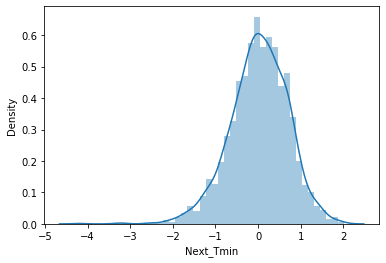

In [36]:
#Predicting through GBR for TMIN
prediction=model.predict(x_test)
sns.distplot(y_test-prediction)

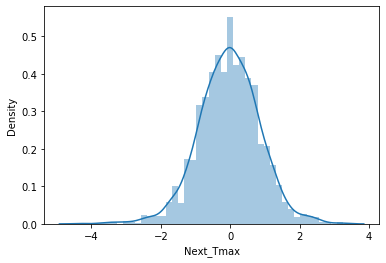

In [57]:
#Predicting through GBR for TMAX
prediction=model.predict(x_test)  #-TMAX
sns.distplot(y_test-prediction)

In [37]:
#Score result through GBR for TMIN
result_ontestfromtrainingset=r2_score(y_test,prediction)
abs(result_ontestfromtrainingset)

0.9224906357941673

In [58]:
#Score result through GBR for TMAX
result_ontestfromtrainingset=r2_score(y_test,prediction) #TMAX
abs(result_ontestfromtrainingset)

0.9216906147243135

Results of test_data

We have achieved an r2_score value of 92% for both targets, which means that we are able to predict values quite near to the actual prices, for majority of the rows as you can see below dataframe.


In [38]:
#saving the model for Tmin
import pickle
filename='Y_Tmin.pkl'
pickle.dump(model,open(filename,'wb'))

In [59]:
#saving the model for Tmax
import pickle
filename='Y_Tmax.pkl'
pickle.dump(model,open(filename,'wb'))

In [42]:
#loading the model for Tmin and checking the score on test data
import pickle
loaded_model=pickle.load(open('Y_Tmin.pkl','rb'))
result=loaded_model.score(x_test,y_test)
print(result)

0.9224906357941673


In [62]:
#loading the model for Tmax and checking the score on test data
import pickle
loaded_model=pickle.load(open('Y_Tmax.pkl','rb'))
result=loaded_model.score(x_test,y_test)
print(result)

0.9216906147243135


In [72]:
#creting dataframe sample for tmin on test data
Conclusion=pd.DataFrame([loaded_model.predict(x_test)[:],pred[:]],index=["Predicted","Original"])


In [63]:
#creting dataframe sample for tmax on test data
Conclusion=pd.DataFrame([loaded_model.predict(x_test)[:],pred[:]],index=["Predicted","Original"]) #-TMAX


In [73]:
loaded_model #TMIN

GradientBoostingRegressor(alpha=0.098, criterion='friedman_mse', init=None,
                          learning_rate=0.1, loss='ls', max_depth=5,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=100,
                          n_iter_no_change=None, presort='auto',
                          random_state=None, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False)

In [64]:
loaded_model #-TMAX

GradientBoostingRegressor(alpha=0.098, criterion='friedman_mse', init=None,
                          learning_rate=0.1, loss='ls', max_depth=5,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=100,
                          n_iter_no_change=None, presort='auto',
                          random_state=None, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False)

In [74]:
Conclusion #showing dataframe of predicted and actual test vales for TMIN

,0,1,2,3,4,5,6,7,8,9,10,11,...,1885,1886,1887,1888,1889,1890,1891,1892,1893,1894,1895,1896
Predicted,24.784887,24.903567,18.771785,27.241255,23.207773,23.30813,23.397059,27.602174,22.305134,20.378371,26.127392,19.969618,...,19.350034,24.431059,26.53275,24.347665,22.731451,24.092311,22.826451,22.18107,18.972499,22.763576,21.789359,26.21097
Original,24.784887,24.903567,18.771785,27.241255,23.207773,23.30813,23.397059,27.602174,22.305134,20.378371,26.127392,19.969618,...,19.350034,24.431059,26.53275,24.347665,22.731451,24.092311,22.826451,22.18107,18.972499,22.763576,21.789359,26.21097


In [65]:
Conclusion #showing dataframe of predicted and actual test vales for TMAX

,0,1,2,3,4,5,6,7,8,9,10,11,...,1885,1886,1887,1888,1889,1890,1891,1892,1893,1894,1895,1896
Predicted,32.37981,34.813704,27.276562,34.18429,24.974785,32.134989,30.217647,31.7471,28.217461,29.970505,35.753969,29.402493,...,29.203291,33.122887,31.773839,29.392601,34.186065,35.12267,28.021943,33.049857,29.651308,28.9559,26.866711,29.8212
Original,32.37981,34.813704,27.276562,34.18429,24.974785,32.134989,30.217647,31.7471,28.217461,29.970505,35.753969,29.402493,...,29.203291,33.122887,31.773839,29.392601,34.186065,35.12267,28.021943,33.049857,29.651308,28.9559,26.866711,29.8212


FINAL_Temperature Yes!